# Projet 6 : Classifiez automatiquement des biens de consommation

L'objectif du projet est d'effectuer une étude de faisabilité rapide d'un moteur de classification d'articles. Ce notebook permet de traiter, d'extraire des features des données textuelles et visuelles, de les analyser et de les comparer par une approche de classification non supervisée. Une approche facultative rapide de classification supervisée est également implémentée en annexe.

Le notebook est organisé de la manière suivante :

* [**1. Traitement des données textuelles**](#1.-Traitement-des-données-textuelles)
  * [**1.1 Prétraitement des données textuelles**](#1.1-Prétraitement-des-données-textuelles)
    * [**1.1.1 Import du jeu de données**](#1.1.1-Import-du-jeu-de-données)
    * [**1.1.2 Création d'un dataframe avec les labels et les catégories des articles**](#1.1.2-Création-d'un-dataframe-avec-les-labels-et-les-catégories-des-articles)
    * [**1.1.3 Les différentes étapes du prétraitement des données**](#1.1.3-Les-différentes-étapes-du-prétraitement-des-données)
    * [**1.1.4 Visualisation du Word Cloud**](#1.1.4-Visualisation-du-Word-Cloud)
  * [**1.2 Les différentes approches d'extraction des features**](#1.2-Les-différentes-approches-d'extraction-des-features)
    * [**1.2.1 Les approches de type “Bag-of-Words” (BOW)**](#1.2.1-Les-approches-de-type-“Bag-of-Words”-(BOW))
      * [**1.2.1.1 Comptage simple de mots (CountVectorizer)**](#1.2.1.1-Comptage-simple-de-mots-(CountVectorizer))
      * [**1.2.1.2 Vectorisation TF-IDF (Term Frequency-Inverse Document Frequency)**](#1.2.1.2-Vectorisation-TF-IDF-(Term-Frequency-Inverse-Document-Frequency))
    * [**1.2.2 L'approche de type “Word/Sentence embeddings” classique avec Word2Vec**](#1.2.2-L'approche-de-type-“Word/Sentence-embeddings”-classique-avec-Word2Vec)
      * [**1.2.2.1 Création du modèle Word2Vec, de la matrice embedding et du modèle embedding**](#1.2.2.1-Création-du-modèle-Word2Vec,-de-la-matrice-embedding-et-du-modèle-embedding)
      * [**1.2.2.2 Exécution du modèle et clustering**](#1.2.2.2-Exécution-du-modèle-et-clustering)
    * [**1.2.3 Les approches de type “Word/Sentence embeddings” avec BERT**](#1.2.3-Les-approches-de-type-“Word/Sentence-embeddings”-avec-BERT)
      * [**1.2.3.1 BERT (Bidirectional Encoder Representations from Transformers)**](#1.2.3.1-BERT-(Bidirectional-Encoder-Representations-from-Transformers))
        * [**1.2.3.1.1 BERT HuggingFace**](#1.2.3.1.1-BERT-HuggingFace)
        * [**1.2.3.1.2 BERT TensorFlow Hub**](#1.2.3.1.2-BERT-TensorFlow-Hub)
      * [**1.2.3.2 SBERT (Sentence-BERT)**](#1.2.3.2-SBERT-(Sentence-BERT))
    * [**1.2.4 L'approche de type “Word/Sentence embeddings” avec USE (Universal Sentence Encoder)**](#1.2.4-L'approche-de-type-“Word/Sentence-embeddings”-avec-USE-(Universal-Sentence-Encoder))
  * [**1.3 Classement des différentes approches d'extraction de features**](#1.3-Classement-des-différentes-approches-d'extraction-de-features)
* [**2. Traitement des données visuelles**](#2.-Traitement-des-données-visuelles)
  * [**2.1 Visualisation d'exemples d'images**](#2.1-Visualisation-d'exemples-d'images)
  * [**2.2 Les différentes approches d'extraction de features**](#2.2-Les-différentes-approches-d'extraction-de-features)
    * [**2.2.1 Les algorithmes de type SIFT/ORB/SURF**](#2.2.1-Les-algorithmes-de-type-SIFT/ORB/SURF)
      * [**2.2.1.1 Exemples de détection de features**](#2.2.1.1-Exemples-de-détection-de-features)
        * [**2.2.1.1.1 Détection de features par ORB (Oriented FAST and Rotated BRIEF)**](#2.2.1.1.1-Détection-de-features-par-ORB-(Oriented-FAST-and-Rotated-BRIEF))
        * [**2.2.1.1.2 Détection de features par SIFT (Scale-Invariant Feature Transform)**](#2.2.1.1.2-Détection-de-features-par-SIFT-(Scale-Invariant-Feature-Transform))
      * [**2.2.1.2 Extraction de features avec ORB**](#2.2.1.2-Extraction-de-features-avec-ORB)
      * [**2.2.1.3 Extraction de features avec SIFT**](#2.2.1.3-Extraction-de-features-avec-SIFT)
    * [**2.2.2 Les algorithmes de type CNN par le Transfer Learning**](#2.2.2-Les-algorithmes-de-type-CNN-par-le-Transfer-Learning)
      * [**2.2.2.1 Le modèle ResNet101**](#2.2.2.1-Le-modèle-ResNet101)
      * [**2.2.2.2 Le modèle ResNet50**](#2.2.2.2-Le-modèle-ResNet50)
      * [**2.2.2.3 Le modèle EfficientNetB7**](#2.2.2.3-Le-modèle-EfficientNetB7)
  * [**2.3. Classement des différentes approches d'extraction de features**](#2.3-Classement-des-différentes-approches-d'extraction-de-features)
* [**3. Combinaison de features et comparaison des classifications**](#3.-Combinaison-de-features-et-comparaison-des-classifications)
  * [**3.1 Combinaison de features des données textuelles et visuelles**](#3.1-Combinaison-de-features-des-données-textuelles-et-visuelles)
  * [**3.2 Comparaison des classifications non supervisées**](#3.2-Comparaison-des-classifications-non-supervisées)
    * [**3.2.1 Clusterings**](#3.2.1-Clusterings)
      * [**3.2.1.1 Features des données textuelles**](#3.2.1.1-Features-des-données-textuelles)
      * [**3.2.1.2 Features des données visuelles**](#3.2.1.2-Features-des-données-visuelles)
      * [**3.2.1.3 Combinaison de features des données textuelles et visuelles**](#3.2.1.3-Combinaison-de-features-des-données-textuelles-et-visuelles)
    * [**3.2.2 Classement des différents types de features**](#3.2.2-Classement-des-différents-types-de-features)
* [**Conclusion**](#Conclusion)
* [**ANNEXE 1 : Comparaison des classifications supervisées**](#ANNEXE-1-:-Comparaison-des-classifications-supervisées)
  * [**1. Sélection des modèles par la validation croisée et prédictions**](#1.-Sélection-des-modèles-par-la-validation-croisée-et-prédictions)
    * [**1.1 Features des données textuelles**](#1.1-Features-des-données-textuelles)
    * [**1.2 Features des données visuelles**](#1.2-Features-des-données-visuelles)
    * [**1.3 Combinaison de features des données textuelles et visuelles**](#1.3-Combinaison-de-features-des-données-textuelles-et-visuelles)
  * [**2. Classement des différents types de features**](#2.-Classement-des-différents-types-de-features)

In [1]:
# Project 6: Automatically classify consumer goods
# Import libraries
import warnings
import pandas as pd
%pylab inline
import seaborn as sns
import json
import time
import string
import logging

import nltk
import contractions
import gensim
import tensorflow as tf
import tensorflow_hub as hub
import cv2 as cv

# Preprocessing, dimensionality reduction,
# and clustering (unsupervised classification) libraries
from sklearn import (preprocessing, cluster, metrics,
                     manifold, decomposition)
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk import word_tokenize
from nltk.corpus import stopwords
from wordcloud import WordCloud
from matplotlib.image import imread
from joblib import cpu_count

# Bag-of-Words (BOW) libraries
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# LDA library
from sklearn.decomposition import LatentDirichletAllocation

# Word/Sentence embeddings models (Word2Vec)
# and Deep Learning (BERT and USE) libraries
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import (Input, Embedding,
                                     GlobalAveragePooling1D)
from tensorflow.keras.models import Model
from gensim import utils
from transformers import TFAutoModel, AutoTokenizer
from sentence_transformers import SentenceTransformer

# CNN (Convolutional Neural Network) Transfer learning libraries
from tensorflow.keras.applications.resnet import ResNet101
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.efficientnet import EfficientNetB7
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Supervised Classification libraries
from sklearn.model_selection import train_test_split
from pycaret.classification import (setup, compare_models,
                                    predict_model, plot_model)

# Disable WARNING, INFO and DEBUG logging everywhere
warnings.filterwarnings('ignore')
logging.disable(logging.WARNING)

plt.style.use('seaborn')

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


Le clustering est une méthode de classification non supervisée. Nous utilisons ici l'algorithme du KMeans qui permet de rechercher efficacement une partition des données dont la variance intra-cluster est minimale. Le modèle peut retourner un minimum local plutôt que global. L'initialisation "k-means++" ainsi que des répétitions multiples permettent de mitiger ce problème. L'objectif du clustering est de respecter les contraintes d'homogénéité (petites distances intra-clusters) et de séparation (grandes distances inter-clusters).

La méthode de réduction de dimesion utilisée pour la visualisation des données est le t-SNE. Le t-SNE est une méthode de réduction de dimension non linéaire qui favorise la structure locale des données et permet de visualiser des données de très grandes dimensions afin de réduire leurs dimensions (2 ou 3) et de repérer des caractéristiques intéressantes du phénomène à modéliser. La perplexité est le principal paramètre qui représente la balance entre la prise en compte de la structure globale et locale c’est-à-dire une estimation du nombre de voisins proches de chaque point.

Sklearn recommande fortement d'appliquer une autre méthode de réduction de dimension avant d'utiliser le t-SNE pour des données de très grandes dimensions, l'ACP linéaire pour des données denses et le SVD tronqué (TruncatedSVD) pour des données éparses :

- L'ACP linéaire est une méthode de réduction de dimension qui favorise la structure globale des données et qui maximise la variance en minimisant l’erreur en distance euclidienne entre les données originales et la projection.
- Le SVD tronqué est une méthode de réduction de dimension linéaire qui décompose les données en valeurs singulières tronquées. Contrairement à l'ACP, l'estimateur ne centre pas les données avant de calculer la décomposition en valeurs singulières; c'est pourquoi il fonctionne efficacement avec des matrices éparses ou creuses.


Les différentes étapes du clustering sont :
- La réduction de dimension :
  - L'ACP : La réduction par l'ACP permet de créer des variables décorrélées entre elles, et de diminuer leurs dimensions, tout en gardant un pourcentage de variance expliquée élevé (99%) ;
  - Le t-SNE : L'impact est une meilleure séparation des données et une réduction du temps de traitement du clustering.
- La création de clusters à partir du t-SNE ;
- Le calcul de l'ARI de similarité entre les catégories réelles et les clusters ;
- L'affichage du t-SNE selon les catégories réelles et les clusters.


La métrique utilisée pour évaluer les performances des algorithmes d'extraction des features est l'indice de Rand ajusté (ARI). L'indice de Rand ajusté calcule une mesure de similarité entre deux clusterings en considérant toutes les paires d'échantillons et en comptant les paires qui sont assignées dans les mêmes ou différents clusters dans les clusters prédits et réels. La valeur du score ARI des clusters qui sont différents est proche de 0 et proche de 1 pour des clusters identiques.

In [2]:
def apply_clustering(data, perplexity, N_CLUST, apply_pca, apply_svd):
    '''This function applies PCA or TruncatedSVD, t-SNE, clustering
    and calculates ARI of true labels and predicted labels.
    '''
    start_time = time.time()
    
    # Applying the PCA
    if apply_pca is True:
        # Normalization
        transformer = preprocessing.QuantileTransformer(
            output_distribution='normal',
            random_state=0)
        data = transformer.fit_transform(data)

        # Standardization
        scaler = preprocessing.StandardScaler()
        data = scaler.fit_transform(data)
    
        # Using PCA to select decorrelated features for dense matrix
        print("\nDataset dimensions before PCA: {}".format(data.shape))
        pca = decomposition.PCA(n_components=0.99)
        data = pca.fit_transform(data)
        print("Dataset dimensions after PCA: {}".format(data.shape))
    
    # Applying TruncatedSVD
    if apply_svd is True:
        # Normalization
        normalizer = preprocessing.Normalizer(copy=False)
        data = normalizer.fit_transform(data)
        
        # Using TruncatedSVD to select decorrelated features for sparse matrix
        print("\nDataset dimensions before TruncatedSVD: {}".format(
                                                            data.shape))
        svd = decomposition.TruncatedSVD(n_components=650,
                                         random_state=0)
        data = svd.fit_transform(data)
        print("Dataset dimensions after TruncatedSVD: {}".format(data.shape))

    # Applying t-SNE
    tsne = manifold.TSNE(
        # Dimension of the embedded space
        n_components=2,
        # The perplexity is related to the number of nearest neighbors
        # that is used in other manifold learning algorithms
        perplexity=perplexity,
        # Maximum number of iterations for the optimization
        n_iter=2000,
        # Initialization of embedding
        init='pca',
        # The learning rate for t-SNE is usually in the range [10, 1000]
        learning_rate=200,
        # The number of parallel jobs to run for neighbors search
        n_jobs=-1,
        # Determines the random number generator
        random_state=0)
    X_tsne = tsne.fit_transform(data)
    
    kmeans = cluster.KMeans(
        # The number of clusters and
        # the number of centroids to generate
        n_clusters=N_CLUST,
        # Method for initialization: selects initial cluster centers
        # for k-mean clustering in a smart way to speed up convergence
        init='k-means++',
        # Number of time the k-means algorithm will be run
        # with different centroid seeds
        n_init=100,
        # Determines random number generation
        # for centroid initialization
        random_state=0)
    kmeans.fit(X_tsne)
    
    # ARI calculation
    ARI = metrics.adjusted_rand_score(labels, kmeans.labels_)
    duration = time.time() - start_time
    print("Processing time: {:.1f} seconds".format(duration))
    print("ARI: {:.3f}".format(ARI))
    return ARI, X_tsne, kmeans.labels_


def display_clustering(X_tsne, categories, true_labels, pred_labels, ARI):
    '''This function displays t-SNE according to categories and clusters.'''
    tsne_df = pd.DataFrame(X_tsne[:, 0:2],
                       columns=['tsne1', 'tsne2'])
    tsne_df['label'] = true_labels
    tsne_df['category'] = categories
    tsne_df['cluster'] = list(pred_labels)
    N_CLASS = len(np.unique(list(tsne_df['label'])))
    
    # Set seaborn plotting aesthetics as default
    sns.set()
    
    # Define plotting region (1 row, 2 columns)
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    sns.scatterplot(
        data=tsne_df,
        x='tsne1',
        y='tsne2',
        hue='category',
        palette=sns.color_palette('tab10', n_colors=N_CLASS),
        s=60,
        alpha=0.8,
        ax=axes[0],
        legend='brief')
    axes[0].set_title('t-SNE according to true categories',
                      fontsize=26,
                      pad=35,
                      fontweight='bold')
    axes[0].set_xlabel('tsne1',
                       fontsize=21,
                       fontweight='bold')
    axes[0].set_ylabel('tsne2',
                       fontsize=21,
                       fontweight='bold')
    axes[0].legend(prop={'size': 10})
    sns.scatterplot(
        data=tsne_df,
        x='tsne1',
        y='tsne2',
        hue='cluster',
        palette=sns.color_palette('tab10', n_colors=N_CLASS),
        s=60,
        alpha=0.8,
        ax=axes[1],
        legend='brief')
    axes[1].set_title('t-SNE according to predicted clusters',
                      fontsize=26,
                      pad=35,
                      fontweight='bold')
    axes[1].set_xlabel('tsne1',
                       fontsize=21,
                       fontweight='bold')
    axes[1].set_ylabel('tsne2',
                       fontsize=21,
                       fontweight='bold')
    axes[1].legend(prop={'size': 10})
    plt.show()
    print("ARI: {:.3f}".format(ARI))
    print(tsne_df.groupby('cluster').count()['label'])
    

def display_histogram(data, ranking_var, sort, fig_size, color, feat_extract):
    '''This function displays a histogram.'''
    dataviz = data.sort_values([ranking_var], ascending=sort)

    # Setup the figure
    plt.style.use('seaborn')
    ax = dataviz.plot(kind='bar', figsize=fig_size, color=color)
    for value in ax.patches:
        ax.annotate(
            value.get_height(),
            (value.get_x() + value.get_width() / 2,
            value.get_height()),
            ha='center',
            va='bottom')
    fig = ax.get_figure()
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    if feat_extract is True:
        ax.set_title('Feature extraction algorithms'
                     ' ranking by {}'.format(ranking_var))
        ax.set_xlabel('Model')
        ax.set_ylabel('{}'.format(ranking_var))
    else:
        ax.set_title('Feature types ranking by {}'.format(ranking_var))
        ax.set_xlabel('Feature type')
        ax.set_ylabel('{}'.format(ranking_var))
    plt.show()

# 1. Traitement des données textuelles

## 1.1 Prétraitement des données textuelles

### 1.1.1 Import du jeu de données

In [3]:
# 1. Text data processing
# 1.1 Dataset preprocessing
# 1.1.1 Loading the dataset
file = 'Dataset/Flipkart/flipkart_com-ecommerce_sample_1050.csv'
df = pd.read_csv(file)
print(df.shape)
df.head(10)

(1050, 15)


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."
5,893aa5ed55f7cff2eccea7758d7a86bd,2015-12-04 07:25:36 +0000,http://www.flipkart.com/maserati-time-r8851116...,Maserati Time R8851116001 Analog Watch - For ...,"[""Watches >> Wrist Watches >> Maserati Time Wr...",WATEAYAHJ8CUCAYM,24400.0,24400.0,893aa5ed55f7cff2eccea7758d7a86bd.jpg,False,Maserati Time R8851116001 Analog Watch - For ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
6,f355cc1ccb08bd0d283ed979b7ee7515,2015-12-04 07:25:36 +0000,http://www.flipkart.com/camerii-wm64-elegance-...,"Camerii WM64 Elegance Analog Watch - For Men,...","[""Watches >> Wrist Watches >> Camerii Wrist Wa...",WATE6Y6D2MZHWGBZ,1099.0,449.0,f355cc1ccb08bd0d283ed979b7ee7515.jpg,False,"Camerii WM64 Elegance Analog Watch - For Men,...",5,5,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
7,dd0e3470a7e6ed76fd69c2da27721041,2015-12-04 07:25:36 +0000,http://www.flipkart.com/t-star-uft-tsw-005-bk-...,T STAR UFT-TSW-005-BK-BR Analog Watch - For Boys,"[""Watches >> Wrist Watches >> T STAR Wrist Wat...",WATECFFVGFZPAD3D,999.0,399.0,dd0e3470a7e6ed76fd69c2da27721041.jpg,False,T STAR UFT-TSW-005-BK-BR Analog Watch - For B...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
8,41384da51732c0b4df3de8f395714fbb,2015-12-04 07:25:36 +0000,http://www.flipkart.com/alfajr-wy16b-youth-dig...,"Alfajr WY16B Youth Digital Watch - For Men, Boys","[""Watches >> Wrist Watches >> Alfajr Wrist Wat...",WATECHFU4QGFQEJG,5495.0,4995.0,41384da51732c0b4df3de8f395714fbb.jpg,False,"Alfajr WY16B Youth Digital Watc

### 1.1.2 Création d'un dataframe avec les labels et les catégories des articles

Nous allons commencer par créer les labels et les catégories des produits.

In [4]:
# 1.1.2 Creating a dataframe with articles labels and categories
data = pd.DataFrame()
encoder = preprocessing.LabelEncoder()
pictures_id = list(df.image)
data['picture_id'] = pictures_id
data['category'] = df['product_category_tree']

for i in range(len(data.category)):
    string_list = data.category.loc[i]
    string_list = json.loads(string_list)
    text = string_list[0]
    data.category.loc[i] = text.split(' >>')[0]
    
data['label'] = encoder.fit_transform(data['category'])
data.head()

,picture_id,category,label
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,4
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,0
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,0
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,4
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,4


In [5]:
# Labels
data.groupby('label').count().sort_values('picture_id', ascending=False)

,picture_id,category
label,,
0,150,150
1,150,150
2,150,150
3,150,150
4,150,150
5,150,150
6,150,150


In [6]:
# Categories and labels
categories = data.category
category_list = list(set(data['category']))
print(category_list)
labels = data.label
labels_list = list(set(data['label']))
print(labels_list)
N_CLASS = len(category_list)
N_CLASS

['Baby Care', 'Kitchen & Dining', 'Watches', 'Home Decor & Festive Needs', 'Computers', 'Home Furnishing', 'Beauty and Personal Care']
[0, 1, 2, 3, 4, 5, 6]


7

Le nombre de clusters pour l'algorithme du KMeans vaut 7 et correspond au nombre de catégories des articles. Il n'est donc pas utile, pour notre étude, de rechercher le nombre optimal de clusters par la méthode du coude.

In [7]:
# Categories
dataviz = data.groupby('category').count().sort_values('label',
                                                       ascending=False)
dataviz

,picture_id,label
category,,
Baby Care,150,150
Beauty and Personal Care,150,150
Computers,150,150
Home Decor & Festive Needs,150,150
Home Furnishing,150,150
Kitchen & Dining,150,150
Watches,150,150


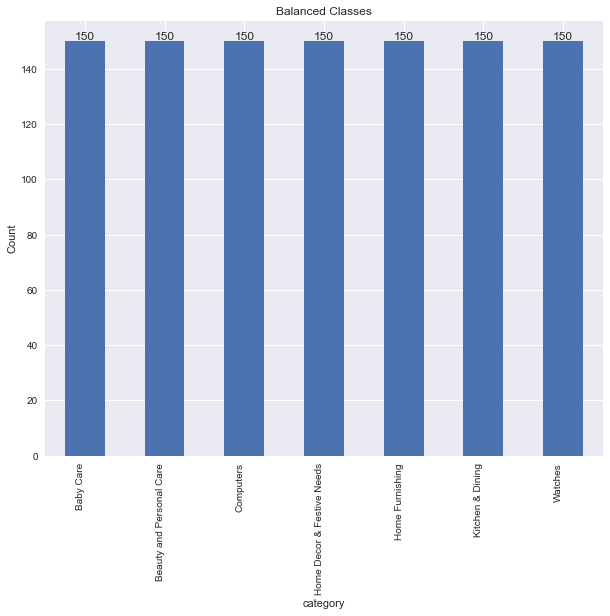

In [8]:
# Classes visualization
# Setup the figure
ax = dataviz.label.plot(kind='bar', figsize=(10, 8))
for value in ax.patches:
    ax.annotate(
        value.get_height(),
        (value.get_x() + value.get_width() / 2,
         value.get_height()),
        ha='center',
        va='bottom')
fig = ax.get_figure()
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    ha='right')
ax.set_title('Balanced Classes')
ax.set_xlabel('category')
ax.set_ylabel('Count')
plt.show()

On visualise sur l'histogramme les 7 catégories de produits et l'équilibre des classes avec 150 échantillons par catégorie.

### 1.1.3 Les différentes étapes du prétraitement des données

La méthode du prétraitement d'un corpus de textes peut être différente selon l'algorithme utilisé. Globalement, les différentes étapes du prétraitement des données textuelles sont :
- La correction des "contracted forms" pour la langue anglaise ;
- La suppression des ponctuations et/ou des chiffres ;
- L’application de la tokenisation (découper un texte en liste de tokens souvent des mots) ;
- La suppression des "stopwords" (mots fréquents non informatifs : prépositions, conjonctions, etc.) ;
- L’application ou non de la lemmatisation ou du stemming selon les différents types d’algorithmes.

On n'effectue pas la lemmatisation pour les algorithmes de Deep Learning qui sont capables de différencier la conjugaison par exemple et qui n'ont donc pas nécessairement besoin de la forme canonique des mots.

In [9]:
# 1.1.3 The different steps of the dataset preprocessing
def corpus_preprocessing_lem(text):
    '''This function fixes the contracted forms
    and builds the list of lemmatized lowercased tokens, 
    excluding stopwords, punctuations, and digits.
    The function returns preprocessed sentences.
    '''
    # Fixing the contracted forms
    text = contractions.fix(text)

    # Removing punctuations
    text_no_punct = "".join([char for char in text
                             if char not in exclude])

    # Removing digits
    text_no_num = "".join([i for i in text_no_punct
                           if not i.isdigit()])
    
    # Tokenizing words
    tokens = word_tokenize(text_no_num.lower())

    # Removing stopwords
    tokens_without_stopwords = [word for word in tokens
                                if word not in stop_words]

    # Applying lemmatization or stemming
    tokens_lem = [lemmatizer.lemmatize(word)
                  for word in tokens_without_stopwords]
    # tokens_stem = [stemmer.stem(word) for word in tokens]
    return " ".join(tokens_lem)


def corpus_preprocessing(text):
    '''This function fixes the contracted forms 
    and builds the list of lowercased tokens,
    excluding punctuations, and digits.
    The function returns preprocessed sentences.
    '''
    # Fixing the contracted forms
    text = contractions.fix(text)

    # Removing punctuations
    text_no_punct = "".join([char for char in text
                             if char not in exclude])

    # Removing digits
    text_no_num = "".join([i for i in text_no_punct
                           if not i.isdigit()])
    
    # Tokenizing words
    tokens = word_tokenize(text_no_num.lower())
    return " ".join(tokens)


def corpus_preprocessing_sw(text):
    '''This function fixes the contracted forms
    and builds the list of lowercased tokens,
    excluding punctuations, and digits.
    The function returns preprocessed sentences.
    '''
    # Fixing the contracted forms
    text = contractions.fix(text)

    # Removing punctuations
    text_no_punct = "".join([char for char in text
                             if char not in exclude])

    # Removing digits
    text_no_num = "".join([i for i in text_no_punct
                           if not i.isdigit()])
    
    # Tokenizing words
    tokens = word_tokenize(text_no_num.lower())

    # Removing stopwords
    tokens_without_stopwords = [word for word in tokens
                                if word not in stop_words]
    return " ".join(tokens_without_stopwords)

In [10]:
tokenizer = nltk.RegexpTokenizer(r'\w+')
stop_words = stopwords.words('english')
stop_words.extend(list(WordCloud().stopwords))
stop_words = list(np.unique(stop_words))
exclude = list(set(string.punctuation))
exclude.extend(['°', '±', '–', '’', '“', '”', '•', '…', '�'])
lemmatizer = WordNetLemmatizer()
# stemmer = PorterStemmer()

Nous ajoutons deux colonnes au jeu de données avec les descriptions prétaitées avec et sans la lemmatisation.

In [11]:
# Preprocessed descriptions with lemmatization
df['processed_description'] = df.description.apply(
    lambda text: corpus_preprocessing_lem(text))

# Preprocessed descriptions without lemmatization and stopwords
df['dl_processed_description'] = df.description.apply(
    lambda text: corpus_preprocessing(text))

# Preprocessed descriptions without lemmatization
df['dl_sw_processed_description'] = df.description.apply(
    lambda text: corpus_preprocessing_sw(text))
df.head(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,processed_description,dl_processed_description,dl_sw_processed_description
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",key feature elegance polyester multicolor abst...,key features of elegance polyester multicolor ...,key features elegance polyester multicolor abs...
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",specification sathiyas cotton bath towel bath ...,specifications of sathiyas cotton bath towel b...,specifications sathiyas cotton bath towel bath...
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",key feature eurospa cotton terry face towel se...,key features of eurospa cotton terry face towe...,key features eurospa cotton terry face towel s...
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",key feature santosh royal fashion cotton print...,key features of santosh royal fashion cotton p...,key features santosh royal fashion cotton prin...
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",key feature jaipur print cotton floral king si...,key features of jaipur print cotton floral kin...,key features jaipur print cotton floral king s...
5,893aa5ed55f7cff2eccea7758d7a86bd,2015-12-04 07:25:36 +0000,http://www.flipkart.com/maserati-time-r8851116...,Maserati Time R8851116001 Analog Watch - For ...,"[""Watches >> Wrist Watches >> Maserati Time Wr...",WATEAYAHJ8CUCAYM,24400.0,24400.0,893aa5ed55f7cff2eccea7758d7a86bd.jpg,False,Maserati Time R8851116001 Analog Watch - For ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp...",maserati time analog watch boy buy maserati ti...,maserati time r analog watch for boys buy mase...,maserati time analog watch boys buy maserati t...
6,f355cc1ccb08bd0d283ed979b7ee7515,2015-12-04 07:25:36 +0000,http://www.flipkart.com/camerii-wm64-elegance-...,"Camerii WM64 Elegance Analog Watch - For Men,...","[""Watches >> Wrist Wa

### 1.1.4 Visualisation du Word Cloud

Le Word Cloud (nuage de mots-clés) est un outil de visualisation qui synthétise les notions les plus importantes d'un corpus de textes.

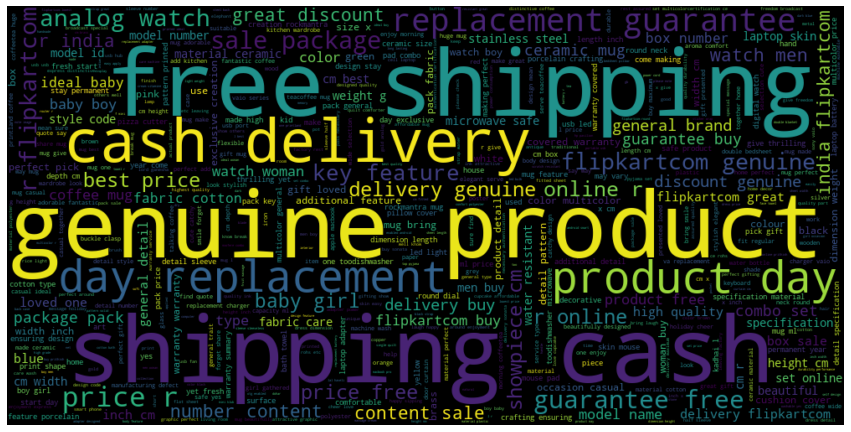

In [12]:
# 1.1.4 Word Cloud visualization
texts = []
for i in range(len(df.processed_description)):
    description = df.processed_description.loc[i]
    texts.append(description)
corpus = " ".join(texts)

# Visualizing texts with a Word Cloud
# Instantiate a new wordcloud
wordcloud = WordCloud(random_state=0,
                      normalize_plurals=False,
                      width=1000,
                      height=500,
                      max_words=500,
                      stopwords=[])
wordcloud.generate(corpus)

# Setup the figure
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Add interpolation = bilinear to smooth things out
plt.imshow(wordcloud, interpolation='bilinear')

# Removing the axis
plt.axis('off')
plt.show()

## 1.2 Les différentes approches d'extraction des features

La vectorisation est le processus général consistant à transformer des documents ou des corpus de textes en vecteurs de caractéristiques numériques pour la modélisation.

In [13]:
# 1.2 The different feature extraction approaches
text_models = []
text_ari = []

### 1.2.1 Les approches de type “Bag-of-Words” (BOW)

Le “Bag-of-Words” (BOW) est une approche simple mais puissante de la vectorisation de texte. Elle ne tient pas compte de la position d'un mot dans un corpus de textes.

In [14]:
# 1.2.1 Bag-of-Words (BOW) approaches
def apply_lda(data, topics_number):
    '''This function instantiates and fits the LDA model.'''
    # Instantiate the LDA model
    lda = LatentDirichletAllocation(
            n_components=topics_number,
            max_iter=5,
            learning_method='online',
            learning_offset=50.,
            random_state=0)

    # Fitting the model
    lda.fit(data)
    return lda


def display_topics(model, feature_names, no_top_words):
    '''This function displays LDA model topics.'''
    for idx, topic in enumerate(model.components_):
        print("Topic {}:".format(idx))
        print(" ".join(
            [feature_names[i]
             for i in topic.argsort()[:-no_top_words - 1:-1]]))

#### 1.2.1.1 Comptage simple de mots (CountVectorizer)

Le CountVectorizer compte les occurrences des mots dans un document ou un corpus de textes. Le problème du comptage des occurrences de mots est que certains mots n'apparaissent que dans un nombre limité de documents et certains mots ne sont pas pertinents pour la modélisation.

(1050, 2041)

Dataset dimensions before TruncatedSVD: (1050, 2041)
Dataset dimensions after TruncatedSVD: (1050, 650)
Processing time: 12.9 seconds
ARI: 0.474


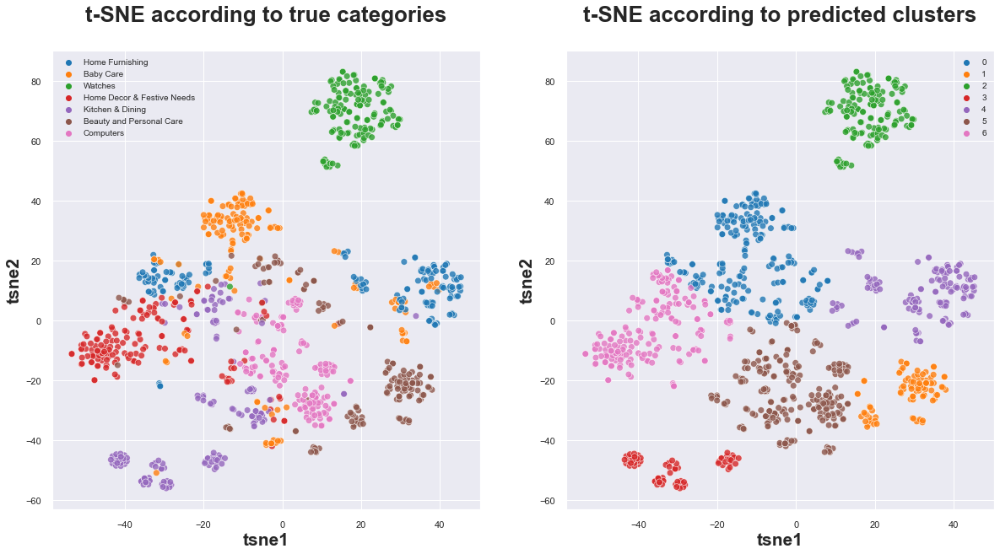

ARI: 0.474
cluster
0    212
1     91
2    149
3     75
4    132
5    211
6    180
Name: label, dtype: int64


In [15]:
# 1.2.1.1 The simple Bag-of-Words approach (CountVectorizer)
tf_vectorizer = CountVectorizer(ngram_range=(1, 1),
                                max_df=0.95,
                                min_df=2,
                                max_features=None,
                                stop_words='english')
X_tf = tf_vectorizer.fit_transform(df['processed_description'])

# Converting sparse matrix to numpy array
tf_features = np.asarray(X_tf.todense())
print(tf_features.shape)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=tf_features,
                                            perplexity=30,
                                            N_CLUST=N_CLASS,
                                            apply_pca=False,
                                            apply_svd=True)
text_models.append('CountVectorizer')
text_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

In [16]:
# Topic modeling using LDA (Latent Dirichlet Allocation) model
lda = apply_lda(X_tf, 100)

# Displaying topics
display_topics(lda,
               tf_vectorizer.get_feature_names(),
               20)

Topic 0:
cap purple shower check portia trendy polka head formula tag red apparel branded huge clothes crystal shop baby le movement
Topic 1:
cm polyresin height width blue showpiece treasure material feature fruit depth sale key box number ml package fengshui type water
Topic 2:
usb light flexible power port keyboard portable fan led hub device laptop use price computer bank vacuum kurta cable perfect
Topic 3:
charming love swarovski environment exporter spray rating star trend copper class fengshui artificial empower volume harness month damaged reading stitched
Topic 4:
eye beauty cream lip oxyglow face massage fruit vitamine care range product glow butter gel cosmetic bleach oil wash oxy
Topic 5:
light led bulb rice wire diwali white vrct pvc crystle lighting strip new flexible festival unbreakable colourful glow virtually outdoor
Topic 6:
copper jug glass craft india water problem time drink inch deal method capacity utensil serving mm quantity surface doctor tablet
Topic 7:
duvet

#### 1.2.1.2 Vectorisation TF-IDF (Term Frequency-Inverse Document Frequency)

L'idée générale de la vectorisation TF-IDF consiste à normaliser le comptage simple de mots par le nombre de fois qu'ils apparaissent dans un document ou un corpus de textes. La vectorisation TF-IDF donne une représentation numérique des mots qui dépend de la nature et du nombre de documents. Les mêmes mots auront des représentations vectorielles différentes dans un autre corpus de textes (un autre contexte).

Les limites :
- Le contexte et le sens sont perdus ;
- La matrice des termes du document est vaste et éparse ;
- La vectorisation est relative au corpus (des mots similaires auront des vecteurs différents avec un autre corpus de textes).

(1050, 2041)

Dataset dimensions before TruncatedSVD: (1050, 2041)
Dataset dimensions after TruncatedSVD: (1050, 650)
Processing time: 12.6 seconds
ARI: 0.518


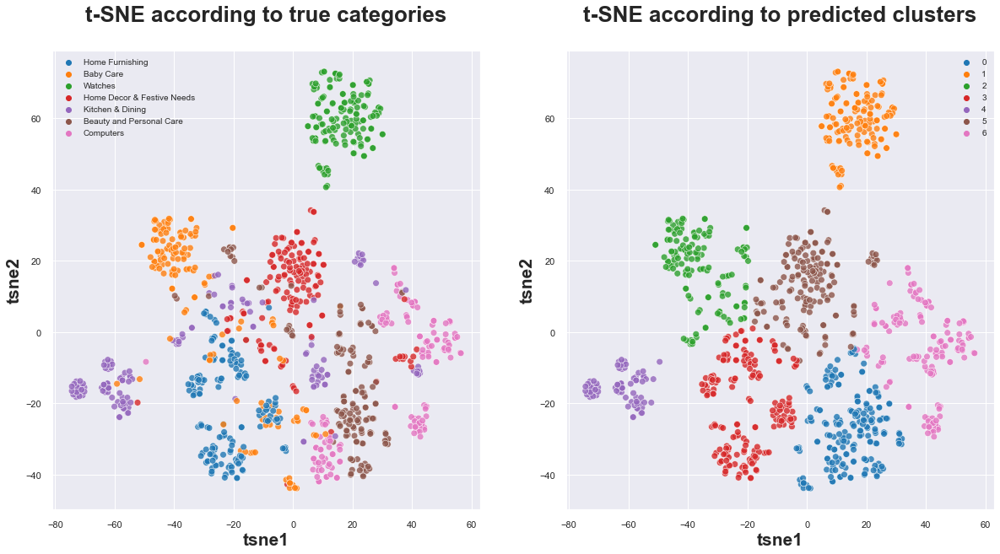

ARI: 0.518
cluster
0    195
1    150
2    141
3    179
4     78
5    163
6    144
Name: label, dtype: int64


In [17]:
# 1.2.1.2 Vectorisation TF-IDF
# (Term Frequency-Inverse Document Frequency)
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 1),
                                   max_df=0.95,
                                   min_df=2,
                                   max_features=None,
                                   norm='l2',
                                   stop_words='english')
X_tfidf = tfidf_vectorizer.fit_transform(df['processed_description'])

# Converting sparse matrix to numpy array
tfidf_features = np.asarray(X_tfidf.todense())
print(tfidf_features.shape)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=tfidf_features,
                                            perplexity=30,
                                            N_CLUST=N_CLASS,
                                            apply_pca=False,
                                            apply_svd=True)
text_models.append('TfidfVectorizer')
text_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

In [18]:
# Topic modeling using LDA (Latent Dirichlet Allocation) model
lda = apply_lda(X_tfidf, 100)

# Displaying topics
display_topics(lda,
               tfidf_vectorizer.get_feature_names(),
               20)

Topic 0:
rajasthan stick class gb tag spoon princess attractive aapno monitor tallenge formula sunscreen video chronograph delivery check healthy ram included
Topic 1:
beauty mug coffee woven pink submerge sheesham curl fruit lotion plain face dark ensure conditioner differ disclaimer men rajasthani accessory
Topic 2:
adapter shelf vanity jewellery mm output canon uv cute handloom urban wall need yes loop flipkartcom washing meeting box laptop
Topic 3:
charming love swarovski environment exporter spray rating star trend copper class fengshui artificial empower volume harness month damaged reading stitched
Topic 4:
pizza fast sofa cutting skin bottle velvet bag pack safe price congestion precise lemon provide virtually steel manufacturer blue stop
Topic 5:
kadhai cash cookware inflatable peacock wd product genuine delivery stick hard bed forlarge best depend intex giftsthatwow premium follow shipping
Topic 6:
check family drive anti cap breeze pen red gb wiping cmw belonging carved stud

### 1.2.2 L'approche de type “Word/Sentence embeddings” classique avec Word2Vec

Les approches de type "Word embeddings" permettent de corriger les limites de l'approche "Bag-of-Words" :
 - Ils capturent la relation sémantique entre les mots ;
 - Ce sont des vecteurs denses, ce qui signifie que toutes leurs valeurs sont non nulles. Plus d'informations sont données au modèle ;
 - Les représentations vectorielles sont indépendantes de la nature et du contenu du corpus de textes (nombre de documents).

Word2Vec est créé en entraînant un réseau neuronal sur un très grand corpus de phrases. Le modèle utilise les coefficients de la dernière couche du réseau de neurones comme éléments du vecteur de mots. Le principal atout de Word2Vec est sa capacité à encoder le sens des mots.
Il exite deux cas pour l'entraînement du réseau neurones avec Word2vec :
- CBOW ou continuous bag-of-words prédit le mot en fonction du contexte. Il fonctionne bien pour les mots courants, mais moins bien pour les mots rares.
- Skip-Gram : prédit le contexte à partir du mot. Il fonctionne bien avec une petite quantité de données d'entraînement et représente correctement les mots ou les phrases rares.

Les limites du "Word embeddings" :
 - Ils ont un biais culturel provenant de l'ensemble de données d'entrainement ;
 - Certains mots ne sont pas identifiés. On les appelle les out-of-vocabulary words (mots hors vocabulaire).

#### 1.2.2.1 Création du modèle Word2Vec, de la matrice embedding et du modèle embedding

In [19]:
# 1.2.2 The classic "Word/Sentence" embeddings approach with Word2Vec
# 1.2.2.1 Creating the Word2Vec model, the embedding matrix,
# and the embedding model
start_time = time.time()
w2v_size = 300
w2v_window = 5
w2v_min_count = 1
w2v_epochs = 300

# Maximum length of sentences
max_length = 2350 
sentences = df['processed_description'].to_list()
sentences = [utils.simple_preprocess(text) for text in sentences]

# Building and training the Word2Vec model
w2v_model = gensim.models.Word2Vec(
    # Ignores all words with total frequency lower than this
    min_count=w2v_min_count,
    # Maximum distance between the current
    # and predicted word within a sentence
    window=w2v_window,
    # Dimensionality of the word vectors
    vector_size=w2v_size,
    # Seed for the random number generator
    seed=0,
    # Use these many worker threads to train the model
    # (faster training with multicore machines)
    workers=1,
    # Training algorithm: 1 for skip-gram; otherwise CBOW
    sg=0,
    # If 0, use the sum of the context word vectors
    # If 1, use the mean, only applies when cbow is used
    cbow_mean=1,
    # Number of iterations (epochs) over the corpus
    epochs=5)
w2v_model.build_vocab(sentences)
w2v_model.train(sentences,
                total_examples=w2v_model.corpus_count,
                epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: {}".format(len(w2v_words)))
print("Word2Vec trained: {}".format(w2v_model))

# Fitting the Tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                            maxlen=max_length,
                            padding='post')                      
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: {}".format(num_words))

# Creating the embedding matrix
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))

i = 0
j = 0
for word, idx in word_index.items():
    i += 1
    if word in w2v_words:
        j += 1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
word_rate = np.round(j / i, 4)
print("\nWord embedding rate: {}".format(word_rate))
print("Embedding matrix: {}".format(str(embedding_matrix.shape)))

# Creating the embedding matrix
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))

i = 0
j = 0
for word, idx in word_index.items():
    i += 1
    if word in w2v_words:
        j += 1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]        
word_rate = np.round(j / i, 4)
print("\nWord embedding rate: {}".format(word_rate))
print("Embedding matrix: {}".format(str(embedding_matrix.shape)))

# Creating the embedding model
input = Input(shape=(len(x_sentences), max_length),
              dtype='float64')
word_input = Input(shape=(max_length,),
                   dtype='float64')  
word_embedding = Embedding(input_dim=vocab_size,
                           output_dim=w2v_size,
                           weights=[embedding_matrix],
                           input_length=max_length)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embedding_model = Model([word_input], word_vec)
duration = time.time() - start_time
print("\nProcessing time: {:.1f} seconds".format(duration))
embedding_model.summary()

Vocabulary size: 4913
Word2Vec trained: Word2Vec(vocab=4913, vector_size=300, alpha=0.025)
Number of unique words: 4914

Word embedding rate: 1.0
Embedding matrix: (4914, 300)

Word embedding rate: 1.0
Embedding matrix: (4914, 300)

Processing time: 28.0 seconds
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 2350)]            0         
                                                                 
 embedding (Embedding)       (None, 2350, 300)         1474200   
                                                                 
 global_average_pooling1d (G  (None, 300)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 1,474,200
Trainable params: 1,474,200
Non-trainable params: 0
____________________________________________________

#### 1.2.2.2 Exécution du modèle et clustering

(1050, 300)

Dataset dimensions before PCA: (1050, 300)
Dataset dimensions after PCA: (1050, 150)
Processing time: 13.5 seconds
ARI: 0.466


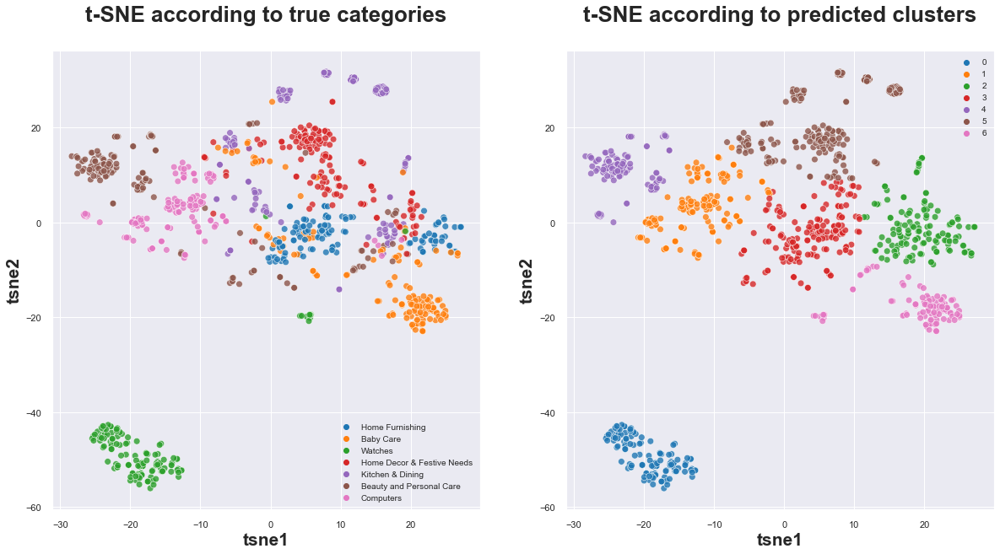

ARI: 0.466
cluster
0    138
1    164
2    150
3    186
4    113
5    195
6    104
Name: label, dtype: int64


In [20]:
# 1.2.2.2 Model running and clustering
w2v_features = embedding_model.predict(x_sentences)
print(w2v_features.shape)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=w2v_features,
                                            perplexity=50,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
text_models.append('Word2Vec')
text_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

### 1.2.3 Les approches de type “Word/Sentence embeddings” avec BERT

BERT est un modèle de Deep Learning de Google de type Transformers. Un transformer est un modèle qui effectue des petites étapes de manière constante dont l'architecture est composée d'encodeurs (pour la lecture de texte) et de décodeurs (pour la prédiction) empilés. À chaque étape, il applique un mécanisme d’attention pour comprendre les relations entre les mots d'une phrase. Avec BERT, les transformers sont entrainés de manière bidirectionnelle. Cette méthode d'entrainement lui permet de mieux comprendre le sens et le contexte d'une phrase ou d'un corpus de textes.

Les principales caractéristiques d'un modèle BERT :
- Pré-entrainé de façon non supervisée ;
- Rapidité d'apprentissage ;
- Performant en matière de résultats ;
- Capable de comparer le sens de deux phrases pour voir si elles sont équivalentes ;
- Capable de générer du texte.

Il existe plusieurs modèles BERT pré-entraînés. Il faut donc sélectionner le modèle le plus adapté à la tâche à effectuer.
Chaque modèle BERT possède sa propre fonction de prétraitement. Il est également possible d'entraîner BERT de façon supervisé sur un problème spécifique avec le Fine-tuning.

La longueur des phrases est une limitation de BERT car le temps de calcul augmente rapidement avec un corpus composé de phrases longues (même avec GPU).

#### 1.2.3.1 BERT (Bidirectional Encoder Representations from Transformers)

In [21]:
# 1.2.3 “Word/Sentence embeddings” approaches with BERT
# 1.2.3.1 BERT (Bidirectional Encoder Representations from Transformers)
def bert_inputs(sentences, bert_tokenizer, max_length):
    '''This function preprocesses input sentences
    to transform them into BERT inputs.
    '''
    input_ids = []
    token_type_ids = []
    attention_mask = []
    tot_bert_inp = []
    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(
            sent,                               
            add_special_tokens=True,
            max_length=max_length,
            padding='max_length',
            return_attention_mask=True,
            return_token_type_ids=True,
            truncation=True,
            return_tensors="tf")
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        tot_bert_inp.append((bert_inp['input_ids'][0],
                             bert_inp['token_type_ids'][0],
                             bert_inp['attention_mask'][0]))
    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    return input_ids, token_type_ids, attention_mask, tot_bert_inp


def bert_create_features(model, model_type, sentences,
                         max_length, batch_size, mode):
    '''This function creates features with BERT HuggingFace
    and TensorFlow Hub models.
    '''
    start_time = time.time()
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    for step in range(len(sentences) // batch_size):
        idx = step * batch_size
        input_ids, token_type_ids, attention_mask, tot_bert_inp = bert_inputs(
            sentences[idx:idx + batch_size],
            bert_tokenizer,
            max_length)

        # Bert HuggingFace
        if mode == 'HF':
            outputs = model.predict([input_ids,
                                     attention_mask,
                                     token_type_ids],
                                    batch_size=batch_size)
            last_hidden_states = outputs.last_hidden_state

        # Bert Tensorflow Hub
        if mode == 'TFHub':
            preprocessed_text = {
                "input_word_ids": input_ids,
                "input_mask": attention_mask,
                "input_type_ids": token_type_ids}
            outputs = model(preprocessed_text)
            last_hidden_states = outputs['sequence_output']
        if step == 0:
            tot_last_hidden_states = last_hidden_states
        else:
            tot_last_hidden_states = np.concatenate(
                (tot_last_hidden_states, last_hidden_states))
    features = np.array(tot_last_hidden_states).mean(axis=1)
    duration = time.time() - start_time
    print("Processing time: {:.1f} seconds".format(duration))
    return features

##### 1.2.3.1.1 BERT HuggingFace

HugginFace est une des nombreuses librairies de BERT qui fournit des modèles spécifiques pré-entraînés.

Processing time: 66.2 seconds
(1050, 768)

Dataset dimensions before PCA: (1050, 768)
Dataset dimensions after PCA: (1050, 397)
Processing time: 11.4 seconds
ARI: 0.436


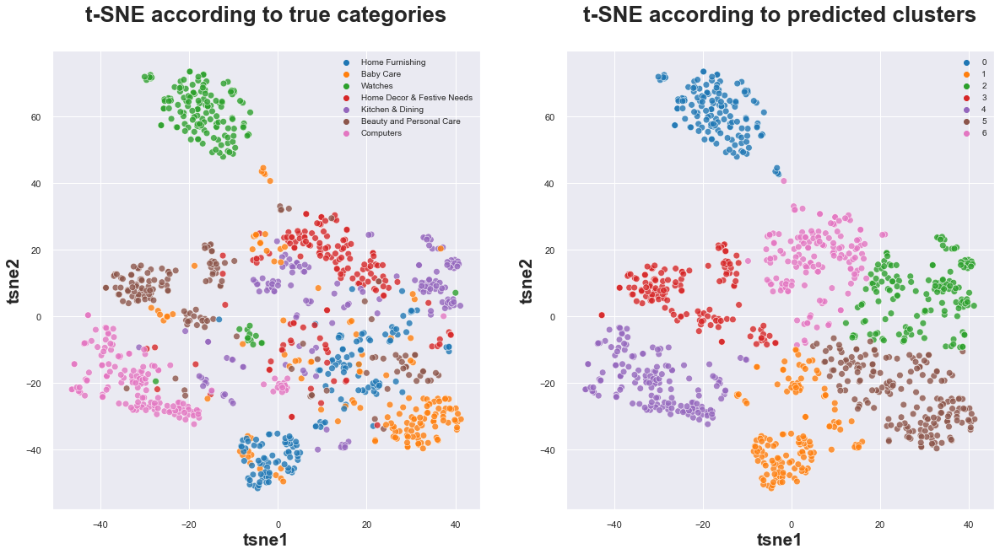

ARI: 0.436
cluster
0    140
1    139
2    148
3    134
4    155
5    181
6    153
Name: label, dtype: int64


In [22]:
# 1.2.3.1.1 BERT HuggingFace
# Feature extraction
sentences = df['dl_processed_description'].to_list()
max_length = 32
batch_size = 5
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)

bert_hf_features = bert_create_features(model, 
                                        model_type,
                                        sentences, 
                                        max_length,
                                        batch_size,
                                        'HF')
print(bert_hf_features.shape)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=bert_hf_features,
                                            perplexity=30,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
text_models.append('BERT HF')
text_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

On remarque que le score ARI est moins bon sans la lemmatisation et la suppression des stopwords.

Processing time: 63.3 seconds
(1050, 768)

Dataset dimensions before PCA: (1050, 768)
Dataset dimensions after PCA: (1050, 385)
Processing time: 16.0 seconds
ARI: 0.494


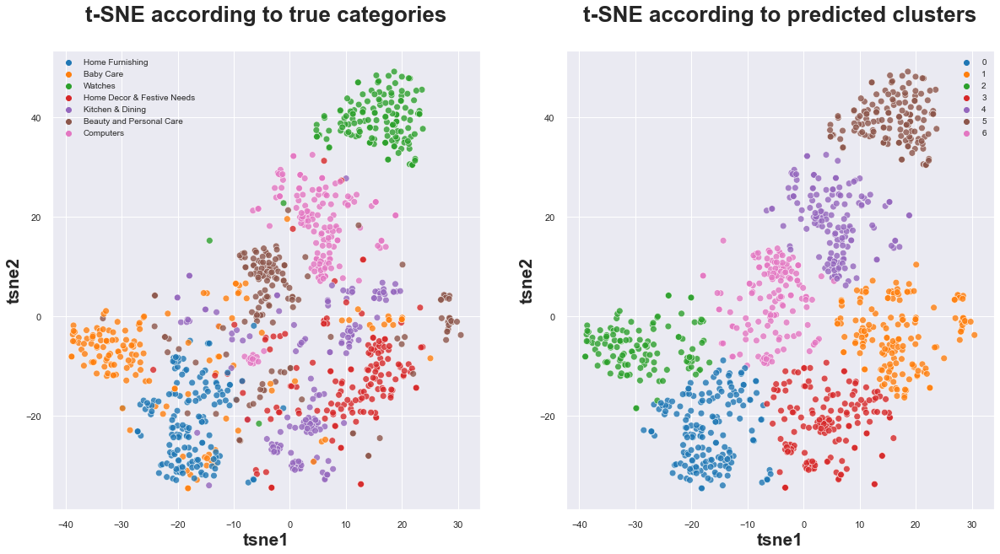

ARI: 0.494
cluster
0    170
1    159
2    124
3    152
4    151
5    147
6    147
Name: label, dtype: int64


In [23]:
# Feature extraction
sentences = df['processed_description'].to_list()
max_length = 32
batch_size = 5
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)

bert_hf_features = bert_create_features(model, 
                                        model_type,
                                        sentences, 
                                        max_length,
                                        batch_size,
                                        'HF')
print(bert_hf_features.shape)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=bert_hf_features,
                                            perplexity=50,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
# text_models.append('BERT HF')
# text_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

On remarque que la lemmatisation et la suppression des stopwords améliorent le score ARI.

##### 1.2.3.1.2 BERT TensorFlow Hub

TensorFlow Hub est une des nombreuses librairies de BERT qui fournit des centaines de modèles pré-entraînés. Bien qu'une fonction unique de prétraitement des données soit implémentée ici, chaque modèle de TensorFlow Hub possède sa propre fonction pour le prétraitement des données.

Nous allons appliquer le modèle "Bert_en_cased" sur les données prétraitées sans la lemmatisation et sans la suppression des stopwords.

Processing time: 152.1 seconds
(1050, 1024)

Dataset dimensions before PCA: (1050, 1024)
Dataset dimensions after PCA: (1050, 454)
Processing time: 16.8 seconds
ARI: 0.413


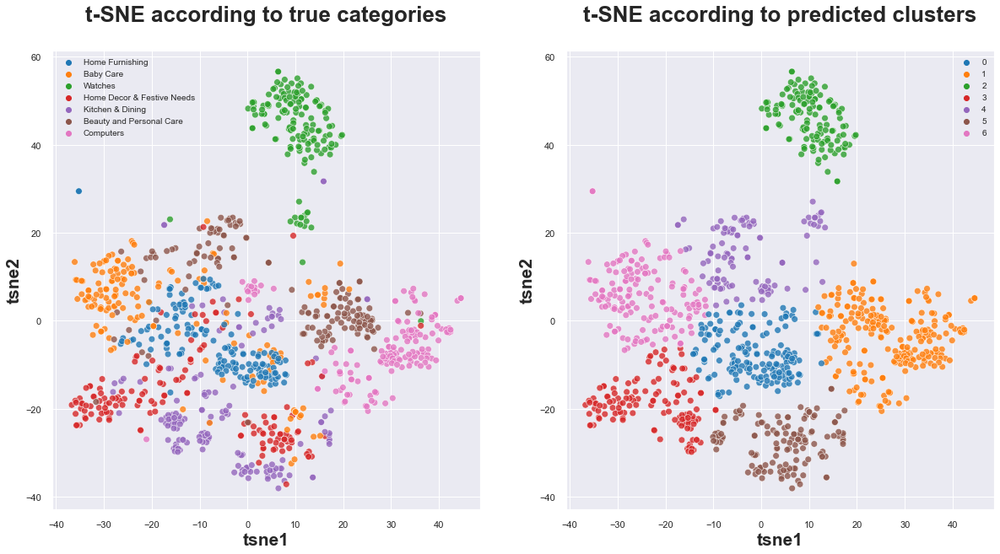

ARI: 0.413
cluster
0    160
1    229
2    136
3    130
4    103
5    134
6    158
Name: label, dtype: int64


In [24]:
# 1.2.3.1.2 BERT TensorFlow Hub
# Feature extraction
sentences = df['dl_processed_description'].to_list()
max_length = 32
batch_size = 5
model_type = 'bert-base-cased'
model_url = 'https://tfhub.dev/tensorflow/bert_en_cased_L-24_H-1024_A-16/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)
model = bert_layer

bert_tfhub_features = bert_create_features(model, 
                                           model_type,
                                           sentences, 
                                           max_length,
                                           batch_size,
                                           'TFHub')
print(bert_tfhub_features.shape)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=bert_tfhub_features,
                                            perplexity=50,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
text_models.append('BERT TFHub')
text_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

Processing time: 150.6 seconds
(1050, 1024)

Dataset dimensions before PCA: (1050, 1024)
Dataset dimensions after PCA: (1050, 449)
Processing time: 14.1 seconds
ARI: 0.463


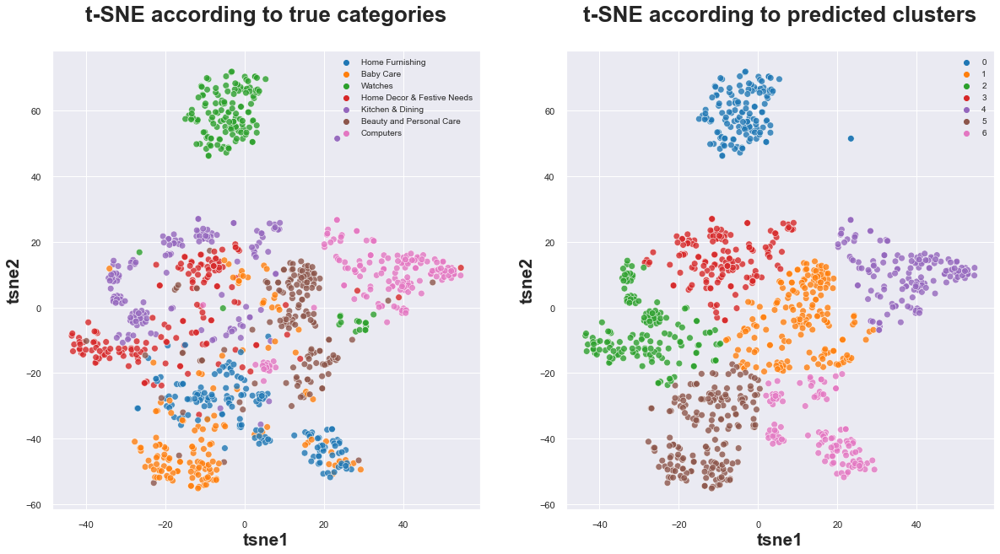

ARI: 0.463
cluster
0    136
1    180
2    153
3    142
4    147
5    181
6    111
Name: label, dtype: int64


In [25]:
# Feature extraction
sentences = df['dl_sw_processed_description'].to_list()
max_length = 32
batch_size = 5
model_type = 'bert-base-cased'
model_url = 'https://tfhub.dev/tensorflow/bert_en_cased_L-24_H-1024_A-16/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)
model = bert_layer

bert_tfhub_features = bert_create_features(model, 
                                           model_type,
                                           sentences, 
                                           max_length,
                                           batch_size,
                                           'TFHub')
print(bert_tfhub_features.shape)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=bert_tfhub_features,
                                            perplexity=30,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
# text_models.append('BERT TFHub')
# text_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

La suppression des stopwords améliore le score ARI.

#### 1.2.3.2 SBERT (Sentence-BERT)

SBERT utilise des réseaux siamois BERT (RoBERTa) pré-entraînés. Cela permet de réduire la durée de traitement tout en maintenant la précision de BERT.

La limitation du modèle SBERT est qu'il ne prend en charge que la langue anglaise.

(1050, 768)
Processing time: 158.4 seconds

Dataset dimensions before PCA: (1050, 768)
Dataset dimensions after PCA: (1050, 381)
Processing time: 12.0 seconds
ARI: 0.715


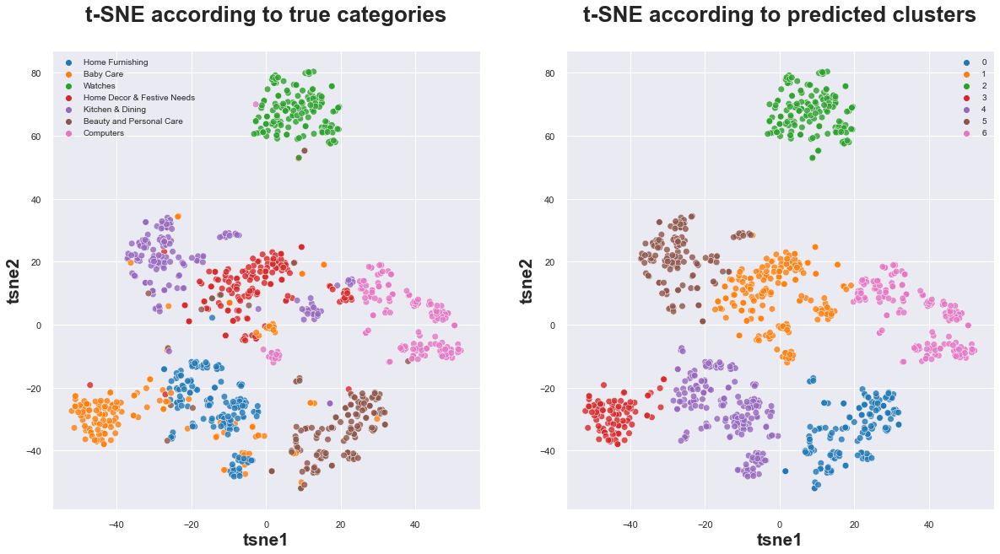

ARI: 0.715
cluster
0    145
1    181
2    154
3     93
4    187
5    136
6    154
Name: label, dtype: int64


In [26]:
# 1.2.3.2 SBERT (Sentence-BERT)
# Feature extraction
start_time = time.time()
sentences = df['dl_processed_description'].to_list()
sbert_model = SentenceTransformer('all-mpnet-base-v2')
sbert_features = sbert_model.encode(sentences)
print(sbert_features.shape)
duration = time.time() - start_time
print("Processing time: {:.1f} seconds".format(duration))

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=sbert_features,
                                            perplexity=30,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
text_models.append('SBERT-MPNet')
text_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

### 1.2.4 L'approche de type “Word/Sentence embeddings” avec USE (Universal Sentence Encoder)

L'encodeur universel de phrases est un modèle de Deep-Learning pré-entraîné qui transforme une phrase ou un texte en vecteurs de nombres réels permettant d'effectuer le regroupement, la similarité des phrases, la classification de texte, etc.

Il existe plusieurs modèles USE pré-entraînés. Il faut donc sélectionner le modèle le plus adapté à la tâche à effectuer.

(1050, 512)
Processing time: 251.1 seconds

Dataset dimensions before PCA: (1050, 512)
Dataset dimensions after PCA: (1050, 305)
Processing time: 17.7 seconds
ARI: 0.516


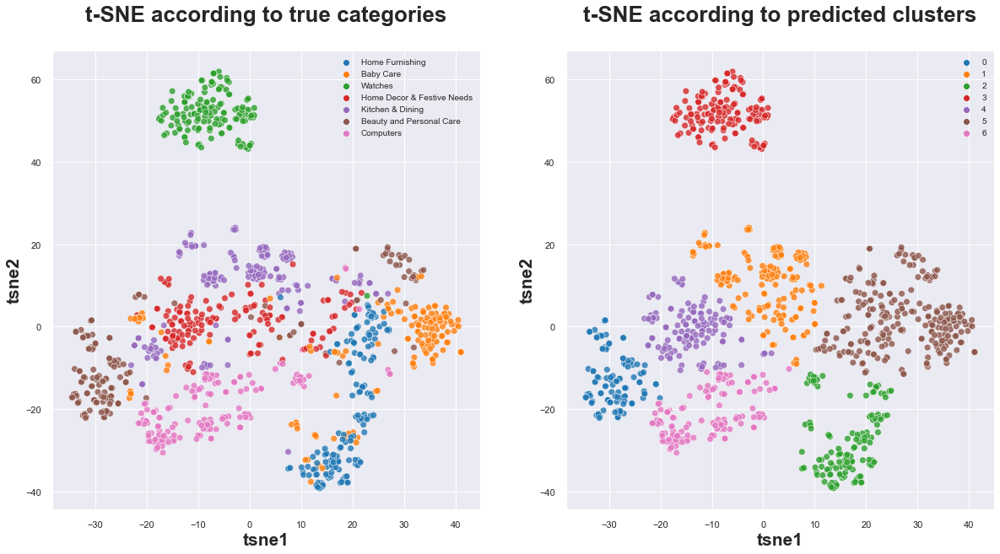

ARI: 0.516
cluster
0    110
1    156
2    133
3    149
4    132
5    240
6    130
Name: label, dtype: int64


In [27]:
# 1.2.4 The "Word/Sentence embeddings" approach with USE
# (Universal Sentence Encoder)
# Feature extraction
start_time = time.time()
sentences = df['dl_processed_description'].to_list()
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/5")
embeddings = embed(sentences)
use_features = np.array(embeddings)
print(use_features.shape)
duration = time.time() - start_time
print("Processing time: {:.1f} seconds".format(duration))

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=use_features,
                                            perplexity=50,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
text_models.append('USE')
text_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

Bien qu'une fonction de prétraitement des données soit implémentée ici, d'après la documentation, il n'est pas nécessaire de prétraiter les données avec USE.

(1050, 512)
Processing time: 353.0 seconds

Dataset dimensions before PCA: (1050, 512)
Dataset dimensions after PCA: (1050, 307)
Processing time: 16.4 seconds
ARI: 0.451


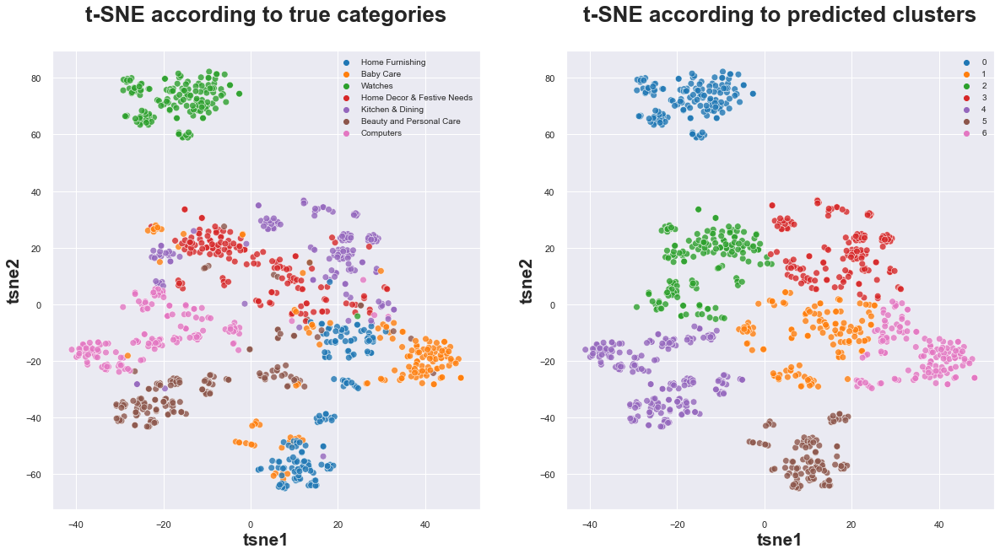

ARI: 0.451
cluster
0    149
1    131
2    168
3    152
4    195
5    111
6    144
Name: label, dtype: int64


In [28]:
# Feature extraction
start_time = time.time()
sentences = df['description'].to_list()
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/5")
embeddings = embed(sentences)
use_features = np.array(embeddings)
print(use_features.shape)
duration = time.time() - start_time
print("Processing time: {:.1f} seconds".format(duration))

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=use_features,
                                            perplexity=30,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
# text_models.append('USE')
# text_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

On remarque que l'ARI est meilleur avec le prétraitement des données.

## 1.3 Classement des différentes approches d'extraction de features

In [29]:
# 1.3 Classification of the different feature extraction approaches
text_classification = pd.DataFrame(columns=['Model', 'ARI'])
text_classification['Model'] = text_models
text_classification['ARI'] = np.round(text_ari, 3)
text_classification = text_classification.sort_values(['ARI'],
                                                      ascending=False)
text_classification.reset_index(inplace=True, drop=True)
text_classification

,Model,ARI
0,SBERT-MPNet,0.715
1,TfidfVectorizer,0.518
2,USE,0.516
3,CountVectorizer,0.474
4,Word2Vec,0.466
5,BERT HF,0.436
6,BERT TFHub,0.413


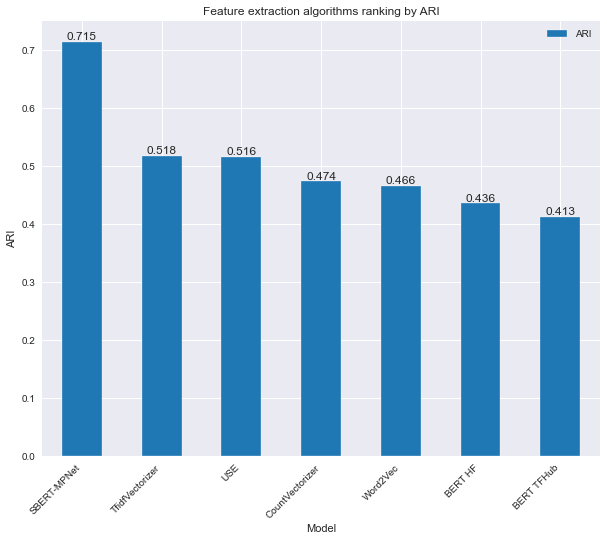

,ARI
Model,
SBERT-MPNet,0.715
TfidfVectorizer,0.518
USE,0.516
CountVectorizer,0.474
Word2Vec,0.466
BERT HF,0.436
BERT TFHub,0.413


In [30]:
# Displaying histogram
text_dataviz = text_classification.set_index('Model')
display_histogram(data=text_dataviz,
                  ranking_var='ARI',
                  sort=False,
                  fig_size=(10, 8),
                  color='tab:blue',
                  feat_extract=True)
text_dataviz

- Le modèle “MPNet base v2” de SBERT est l'algorithme le mieux classé ;
- Les scores ARI des modèles BERT et USE varient selon le type de prétraitement effectué.

# 2. Traitement des données visuelles

## 2.1 Visualisation d'exemples d'images

Les différentes étapes du prétraitement des données visuelles sont :
- Le passage en blanc et noir (l'intensité est le niveau de gris : plus un point est sombre, plus son niveau de gris est faible) ;
- Le redimensionnement ;
- Le filtrage pour éliminer le plus de bruit possible ;
- L’égalisation d’histogramme pour réajuster le contraste d’une image.

Total number of pictures of the dataset: 1050

Displaying 9 pictures:


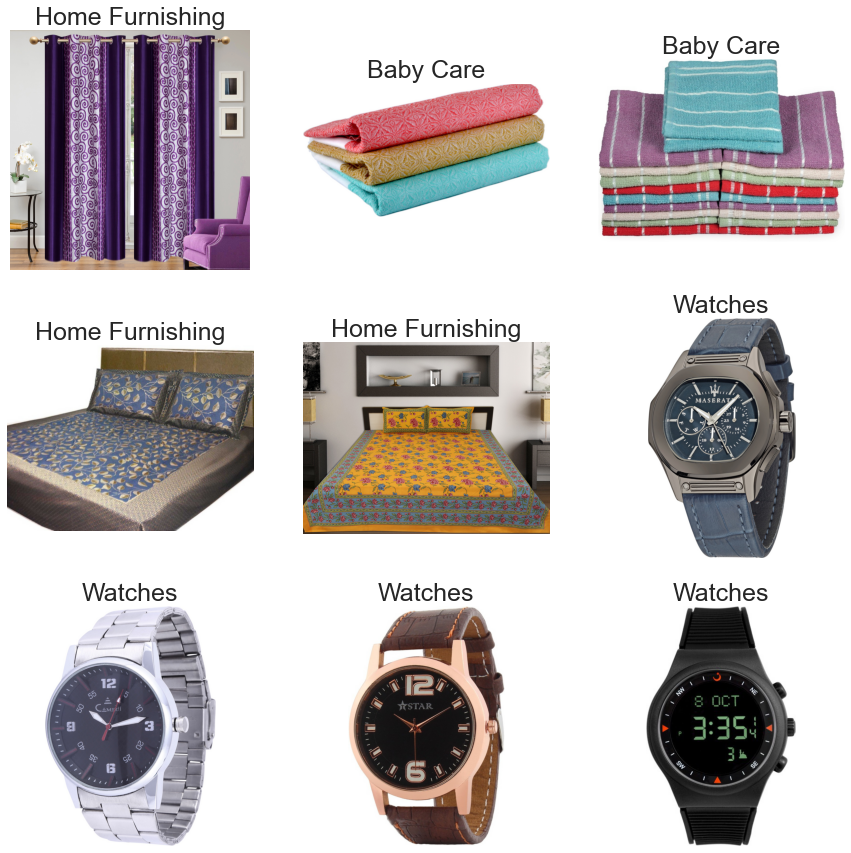

In [31]:
# 2. Visual data processing
# 2.1 Visualizing examples of images
# Loading pictures
path = 'Dataset/Flipkart/Images/'
category_id = list(data.category)
print("Total number of pictures of the dataset: {}".format(len(pictures_id)))

# Visualizations
display_nb = 9
print("\nDisplaying {} pictures:".format(display_nb))

# Setup the figure
plt.figure(figsize=(15, 15))
for i in range(display_nb):
    plt.subplot(3, 3, i + 1)
    filename = path + pictures_id[i]
    image = imread(filename)
    plt.title(category_id[i], fontsize=25)
    plt.axis('off')
    plt.imshow(image)
plt.show()

## 2.2 Les différentes approches d'extraction de features

In [32]:
# 2.2 The different feature extraction approaches
image_models = []
image_ari = []

### 2.2.1 Les algorithmes de type SIFT/ORB/SURF

Les algorithmes de type SIFT/ORB/SURF permettent de créer des "Bag of Visual Words" (BOVW) à partir des descripteurs calculés avec les points d'intérêt d'une image. Un sac de mots visuels est une technique qui permet de calculer les similitudes entre les images.
Un descripteur est un vecteur qui décrit le voisinage du feature auquel il est associé. Les points d'intérêt sont des zones intéressantes de l'image qui doivent être répétables, distinctives et locales. Le clustering permet d'obtenir les centres des clusters qui forment les "Visual Words". En effet, chaque centre de cluster agit comme un mot visuel.

La méthode des histogrammes consiste à effectuer un comptage des mots visuels détecter dans une image. De cette manière, toutes les images seront converties en histogrammes. L'approche BOVW fonctionne bien avec des grandes images qui permettent de capturer les détails.

Les différentes étapes d'extraction des features par les algorithmes de type SIFT/ORB/SURF sont :
- La création des descripteurs de chaque image :
  - Le passage en blanc et noir et l'égalisation de chaque image ;
  - La création d'une liste de descripteurs par image qui sera utilisée pour réaliser les histogrammes par image ;
  - La création d'une liste de descripteurs pour l'ensemble des images qui sera utilisée pour créer les clusters de descripteurs.
- La création des clusters de descripteurs :
  - L'utilisation de MiniBatchKMeans pour obtenir des temps de traitement raisonnables ;
  - Le nombre de clusters égale à la racine carrée du nombre total de descripteurs.
- La création des features des images pour chaque image :
   - La prédiction des numéros de cluster de chaque descripteur ;
   - La création d'un histogramme qui consiste à compter chaque numéro de cluster du nombre de descripteurs de l'image.

In [33]:
# 2.2.1 The SIFT/ORB/SURF algorithms
def feature_extraction(model, pictures_id, denoising, resize, normalize):
    '''This function identifies keypoints and associated descriptors
    and creates clusters of descriptors and image features.
    '''
    
    def build_histogram(kmeans, desc, image_num):
        '''This function makes the prediction of cluster numbers
        for each descriptor and counts each cluster number of a descriptor.
        '''
        # Prediction of cluster numbers for each descriptor
        clusters = kmeans.predict(desc)
        hist = np.zeros(len(kmeans.cluster_centers_))
        nb_desc = len(desc)
        if nb_desc == 0:
            print("Error with image histogram: {}".format(image_num))

        # Counting of each cluster number of a descriptor
        for cluster in clusters:
            hist[cluster] += 1 / nb_desc
        return hist    
    
    # Identification of keypoints and associated descriptors
    start_time = time.time()
    keypoints = []
    for image_num in range(len(pictures_id)) :
        if image_num % 100 == 0:
            print(image_num)

        # Loading the picture
        image = cv.imread(path+pictures_id[image_num], 0)
        
        # Denoising the picture
        if denoising is True:
            img = cv.cvtColor(image, cv.COLOR_GRAY2BGR)
            img = cv.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)

            # Converting the picture in gray
            image = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

        # Resizing the picture
        # Target size
        target_size = (224, 224)
        if resize is True:
            image = cv.resize(image,
                              target_size,
                              interpolation=cv.INTER_AREA)

        # Equalizing the picture histogram to improve the contrast
        equalized_image = cv.equalizeHist(image)
        
        # Keypoints selection and descriptors calculation
        kp, desc = model.detectAndCompute(equalized_image, None)
        keypoints.append(desc)
    keypoints_by_img = np.asarray(keypoints)
    keypoints_all = np.concatenate(keypoints_by_img, axis=0)
    print("\nDescriptors dimensions: {}".format(keypoints_all.shape))
    duration = time.time() - start_time
    print("Model processing time: {:.1f} seconds".format(duration))
    
    # Calculation of clusters number
    start_time = time.time()

    # The number of clusters equals the square root
    # of the total number of descriptors
    k = int(round(np.sqrt(len(keypoints_all)), 0))
    print("\nClusters number: {}".format(k))
    print("Creation of {} descriptors clusters".format(k))

    # Normalization and standardization
    if normalize is True:  
        # Normalization
        transformer = preprocessing.QuantileTransformer(
            output_distribution='normal',
            random_state=0)
        keypoints_all = transformer.fit_transform(keypoints_all)
        
        # Standardization
        scaler = preprocessing.StandardScaler()
        keypoints_all = scaler.fit_transform(keypoints_all)
        
    # Clustering
    kmeans = cluster.MiniBatchKMeans(
        # The number of clusters to form as well as the number
        # of centroids to generate
        n_clusters=k,
        # Number of samples to randomly sample for speeding up the initialization
        init_size=3*k,
        # Size of the mini batches. You can set the batch_size greater than
        # 256 * number of cores to enable parallelism on all cores
        batch_size=256 * cpu_count(),
        # Determines random number generation for centroid initialization
        # and random reassignment
        random_state=0)
    kmeans.fit(keypoints_all)
    duration = time.time() - start_time
    print("Processing time: {:.1f} seconds".format(duration))
    
    # Creating features (histograms)
    start_time = time.time()

    # Creating a matrix of histograms
    hist_vectors = []
    for i, image_desc in enumerate(keypoints_by_img):
        if i % 100 == 0:
            print(i)  

        # Histogram calculation
        hist = build_histogram(kmeans, image_desc, i)

        # Creating the histogram feature vector
        hist_vectors.append(hist)
    img_features = np.asarray(hist_vectors)
    duration = time.time() - start_time
    print("\nTime to create features (histograms): {:.1f} seconds".format(
                                                                duration))
    print("Images features dimensions: {}".format(img_features.shape))
    return img_features


def feature_detection(model, path, img_row, denoising, resize,
                      img_viz, hist_viz):
    '''This function applies a feature detection algorithm
    (ORB and SIFT).
    '''
    # Loading the picture and convert in gray
    image = cv.imread(path + pictures_id[img_row], 0)
    print("\nImage {}:".format(img_row))
    
    # Denoising the picture using non local means filter
    if denoising is True:
        print("Apply denoising algorithm")
        img = cv.cvtColor(image, cv.COLOR_GRAY2BGR)
        img = cv.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)

        # Converting the picture in gray
        image = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Resizing the picture
    if resize is True:
        target_size = (224, 224)
        image = cv.resize(image,
                          target_size,
                          interpolation=cv.INTER_AREA)

    # Equalizing the picture histogram to improve the contrast
    equalized_image = cv.equalizeHist(image)
    
    # Keypoints selection and descriptors calculation
    kp, desc = model.detectAndCompute(equalized_image, None)
    img = cv.drawKeypoints(equalized_image, kp, equalized_image)
    print("Descriptors dimensions: {}\n".format(desc.shape))
    print(desc)

    # Visualizations
    if img_viz is True:
        plt.imshow(img)
        plt.title('Image with keypoints detection', fontsize=25)
        plt.axis('off')
        plt.show()
    if hist_viz is True:
        # Setup the figure
        fig = plt.figure(figsize=(15, 6))
        ax = fig.add_subplot(121)
        ax.hist(image.flatten(),
                bins=range(256),
                color='tab:blue')
        ax.set_title('Original picture', fontsize=25)
        ax.set(xlabel='Grayscale', ylabel='Number of pixels')
        ax = fig.add_subplot(122)
        ax.hist(equalized_image.flatten(),
                bins=range(256),
                color='tab:blue')
        ax.set_title('Equalized picture', fontsize=25)
        ax.set(xlabel='Grayscale', ylabel='Number of pixels')
        plt.show()

#### 2.2.1.1 Exemples de détection de features

##### 2.2.1.1.1 Détection de features par ORB (Oriented FAST and Rotated BRIEF)

L'algorithme ORB permet d’extraire des points d’intérêt (détection) de l’image et de calculer leurs descripteurs (description). C'est une alternative à SIFT et SURF.


Image 0:
Descriptors dimensions: (774, 32)

[[ 14 188 183 ... 100  47 247]
 [222 255 182 ... 247 167 119]
 [252 255 230 ... 247 214 117]
 ...
 [ 80  33   7 ...   8  32   0]
 [222  22 150 ... 117  13  21]
 [195 114  41 ... 167   7 117]]


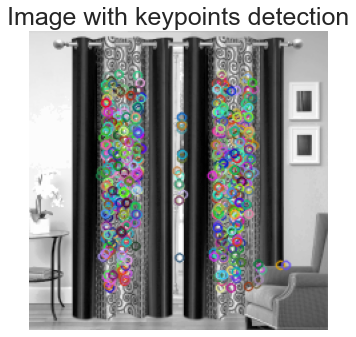

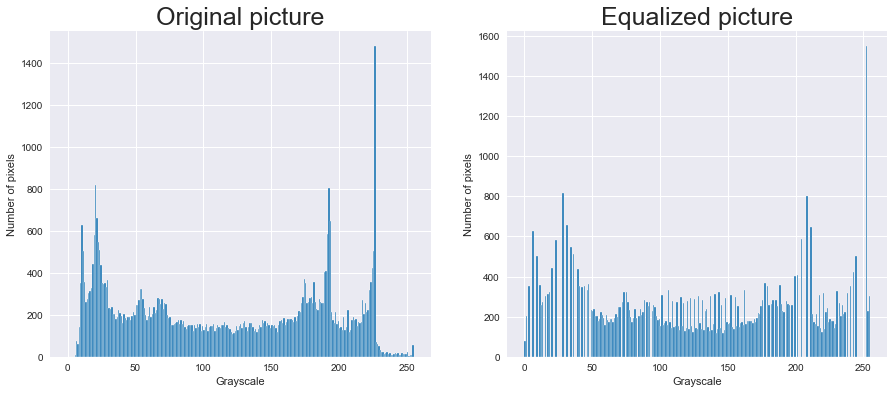


Image 0:
Apply denoising algorithm
Descriptors dimensions: (773, 32)

[[231 237 245 ... 245 208  96]
 [253 190 247 ... 247 214 119]
 [246 255 246 ... 251 230  55]
 ...
 [208  33   7 ...   8  34   2]
 [222  86 158 ... 117  13   3]
 [195 114  41 ... 167   7 117]]


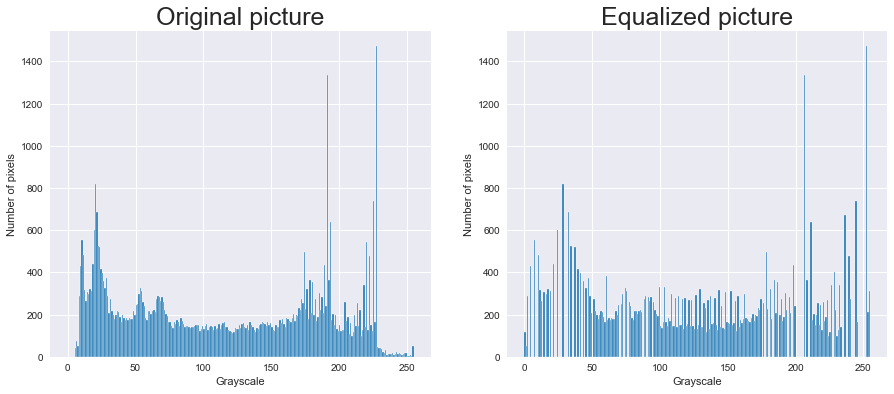


Image 2:
Descriptors dimensions: (788, 32)

[[ 21  92  95 ... 243  32  49]
 [ 66 178 179 ...   0 167 251]
 [ 83 142 204 ... 170  24  89]
 ...
 [182 104 236 ... 189  94 220]
 [114 121 172 ... 126 126 223]
 [135 113 191 ... 127   9 184]]


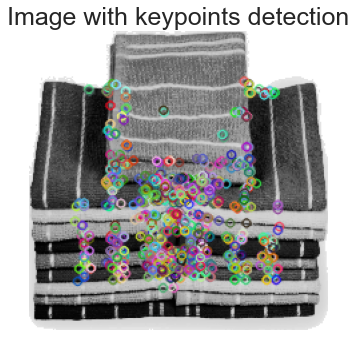

In [34]:
# 2.2.1.1 Examples of feature detection
# 2.2.1.1.1 Feature detection by ORB
# (Oriented FAST and Rotated BRIEF)
# Instantiate the ORB algorithm
orb = cv.ORB_create(nfeatures=1100)

# Apply feature detection
feature_detection(model=orb,
                  path=path,
                  img_row=0,
                  denoising=False,
                  resize=True,
                  img_viz=True,
                  hist_viz=True)
feature_detection(model=orb,
                  path=path,
                  img_row=0,
                  denoising=True,
                  resize=True,
                  img_viz=False,
                  hist_viz=True)
feature_detection(model=orb,
                  path=path,
                  img_row=2,
                  denoising=False,
                  resize=True,
                  img_viz=True,
                  hist_viz=False)

On observe que l'algorithme ORB ne détecte pas tous les points d'intérêt des images et les coins très sensibles aux changements d'échelles.

L'histogramme d'une image numérique représente la répartition de ses pixels selon leur intensité. L'égalisation d'histogramme permet de réajuster le contraste d'une image. Après l'égalisation, l'image est plus contrastée et son histogramme confirme que la distribution de ses niveaux de gris est plus uniforme.

Le filtrage permet d'améliorer l'image en éliminant le plus de bruit possible. Après le filtrage, on observe un étalement d'histogramme. Le filtrage n'est pas appliqué dans notre cas d'étude car la durée de traitement des images est longue pour un impact non significatif.

##### 2.2.1.1.2 Détection de features par SIFT (Scale-Invariant Feature Transform)

L’algorithme SIFT permet d’extraire des points d’intérêt (détection) de l’image et de calculer leurs descripteurs (description). L'algorithme SIFT crée des descripteurs invariants aux changements d'échelles.


Image 0:
Descriptors dimensions: (424, 128)

[[  0.   0.   9. ...  30.  71.  33.]
 [  2. 131. 111. ...   0.   0.   1.]
 [  8.   1.   0. ...  16.   9.   4.]
 ...
 [  3.   0.   0. ...   9.  55.   0.]
 [  0.   0.   0. ...   0.   0.   0.]
 [  1.   0.   3. ...   0.   0.   0.]]


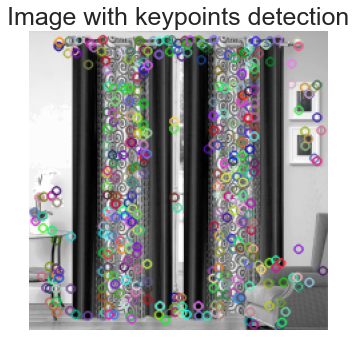


Image 2:
Descriptors dimensions: (616, 128)

[[ 38.  57.  33. ...   0.   0.   0.]
 [  0.   0.   0. ...   0.   1.   7.]
 [ 15.   9.  28. ...   0.   0.   0.]
 ...
 [  0.  56. 157. ...   0.   0.   1.]
 [ 58.   2.   0. ...   0.   0.   0.]
 [  7.  17.   8. ...   0.   0.   2.]]


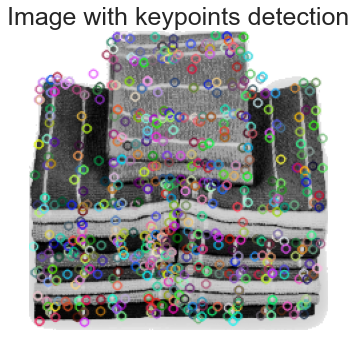

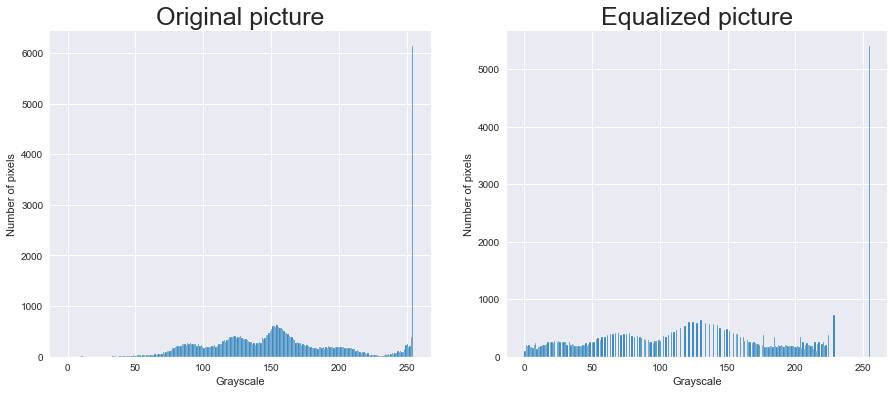


Image 2:
Apply denoising algorithm
Descriptors dimensions: (501, 128)

[[ 34.  65.  36. ...   0.   0.   0.]
 [ 22.   2.   0. ...   0.   0.   0.]
 [ 18.   8.  23. ...   0.   0.   0.]
 ...
 [  1. 141. 159. ...   0.   0.   0.]
 [  0.   0.  15. ...   0.   0.   4.]
 [ 17.   1.   0. ...   0.   0.   0.]]


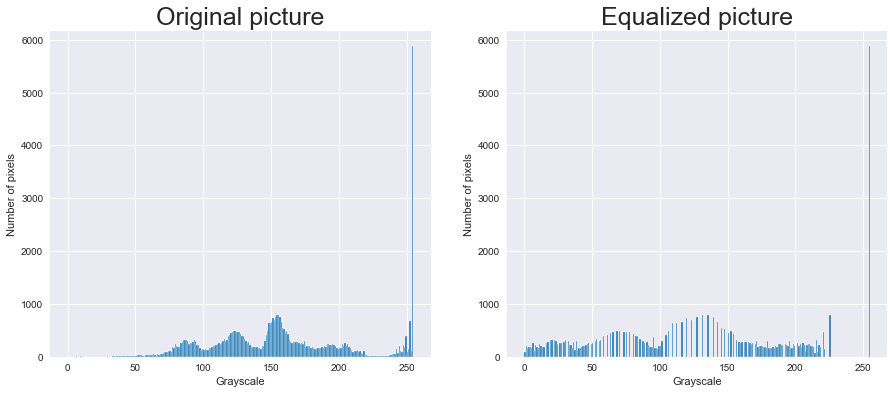

In [35]:
# 2.2.1.1.2 Feature detection by SIFT
# (Scale-Invariant Feature Transform)
# Instantiate the SIFT algorithm
sift = cv.SIFT_create(nfeatures=1100)

# Apply feature detection
feature_detection(model=sift,
                  path=path,
                  img_row=0,
                  denoising=False,
                  resize=True,
                  img_viz=True,
                  hist_viz=False)
feature_detection(model=sift,
                  path=path,
                  img_row=2,
                  denoising=False,
                  resize=True,
                  img_viz=True,
                  hist_viz=True)
feature_detection(model=sift,
                  path=path,
                  img_row=2,
                  denoising=True,
                  resize=True,
                  img_viz=False,
                  hist_viz=True)

On observe que l'algorithme SIFT est plus efficace que l'algorithme ORB pour la détection des points d'intérêts d'une image. L'algorithme SIFT est capable de trouver plusieurs zones d'intérêt dont les coins très sensibles aux changements d'échelles.

L'histogramme d'une image numérique représente la répartition de ses pixels selon leur intensité. L'égalisation d'histogramme permet de réajuster le contraste d'une image. Après l'égalisation, l'image est plus contrastée et son histogramme confirme que la distribution de ses niveaux de gris est plus uniforme.

Le filtrage permet d'améliorer l'image en éliminant le plus de bruit possible. Après le filtrage, on observe un étalement d'histogramme. Le filtrage n'est pas appliqué dans notre cas d'étude car la durée de traitement des images est longue pour un impact non significatif.

#### 2.2.1.2 Extraction de features avec ORB

Descripteurs non standardisés avant le clustering.

0
100
200
300
400
500
600
700
800
900
1000

Descriptors dimensions: (662196, 32)
Model processing time: 21.2 seconds

Clusters number: 814
Creation of 814 descriptors clusters
Processing time: 63.1 seconds
0
100
200
300
400
500
600
700
800
900
1000

Time to create features (histograms): 4.2 seconds
Images features dimensions: (1050, 814)

Dataset dimensions before PCA: (1050, 814)
Dataset dimensions after PCA: (1050, 673)
Processing time: 14.4 seconds
ARI: 0.049


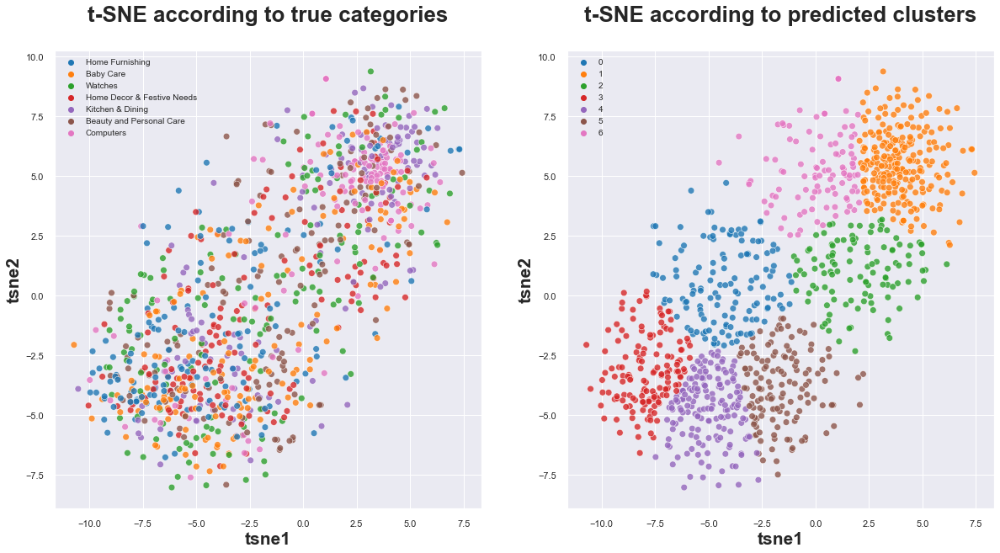

ARI: 0.049
cluster
0    134
1    250
2    111
3    146
4    165
5    137
6    107
Name: label, dtype: int64


In [36]:
# 2.2.1.2 Feature extraction with ORB
# Non-standardized descriptors before clustering
orb = cv.ORB_create(nfeatures=1100,
                    scaleFactor=1.2,
                    nlevels=8,
                    edgeThreshold=31,
                    WTA_K=2,
                    patchSize=31,
                    fastThreshold=20)
orb_features = feature_extraction(model=orb,
                                  pictures_id=pictures_id,
                                  denoising=False,
                                  resize=True,
                                  normalize=False)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=orb_features,
                                            perplexity=70,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
image_models.append('ORB')
image_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

Standardisation des descripteurs avant le clustering.

0
100
200
300
400
500
600
700
800
900
1000

Descriptors dimensions: (662196, 32)
Model processing time: 18.0 seconds

Clusters number: 814
Creation of 814 descriptors clusters
Processing time: 71.0 seconds
0
100
200
300
400
500
600
700
800
900
1000

Time to create features (histograms): 4.1 seconds
Images features dimensions: (1050, 814)

Dataset dimensions before PCA: (1050, 814)
Dataset dimensions after PCA: (1050, 5)
Processing time: 20.7 seconds
ARI: 0.093


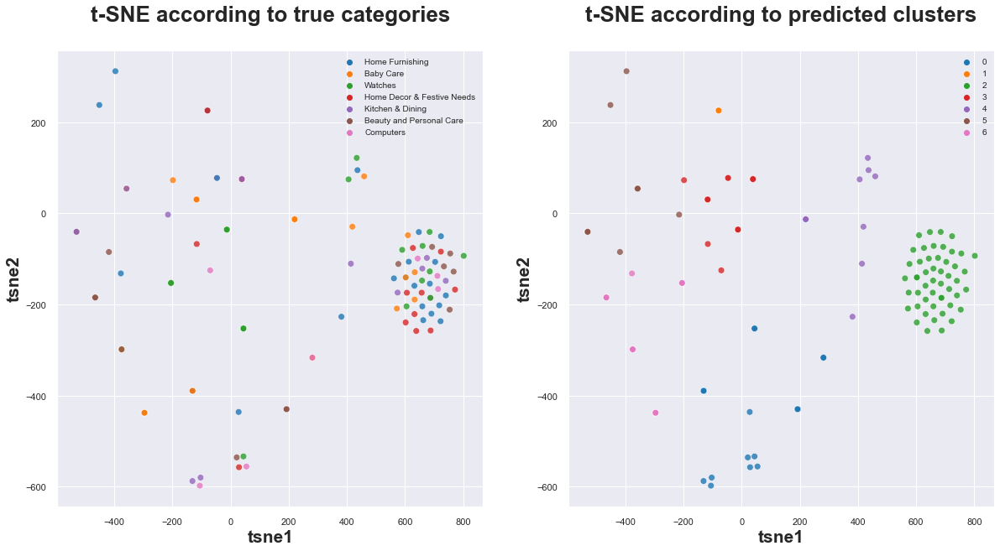

ARI: 0.093
cluster
0    120
1    309
2     50
3    211
4    191
5     57
6    112
Name: label, dtype: int64


In [37]:
# Standardization of descriptors before clustering
orb = cv.ORB_create(nfeatures=1100,
                    scaleFactor=1.2,
                    nlevels=8,
                    edgeThreshold=31,
                    WTA_K=2,
                    patchSize=31,
                    fastThreshold=20)
orb_features = feature_extraction(model=orb,
                                  pictures_id=pictures_id,
                                  denoising=False,
                                  resize=True,
                                  normalize=True)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=orb_features,
                                            perplexity=70,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
# image_models.append('ORB')
# image_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

En normalisant les descripteurs avant le clustering, on obtient un meilleur score ARI. En revanche, on observe une perte trop importante d'informations.

#### 2.2.1.3 Extraction de features avec SIFT

Descripteurs non standardisés avant le clustering.

0
100
200
300
400
500
600
700
800
900
1000

Descriptors dimensions: (354061, 128)
Model processing time: 56.4 seconds

Clusters number: 595
Creation of 595 descriptors clusters
Processing time: 32.0 seconds
0
100
200
300
400
500
600
700
800
900
1000

Time to create features (histograms): 2.3 seconds
Images features dimensions: (1050, 595)

Dataset dimensions before PCA: (1050, 595)
Dataset dimensions after PCA: (1050, 528)
Processing time: 22.0 seconds
ARI: 0.049


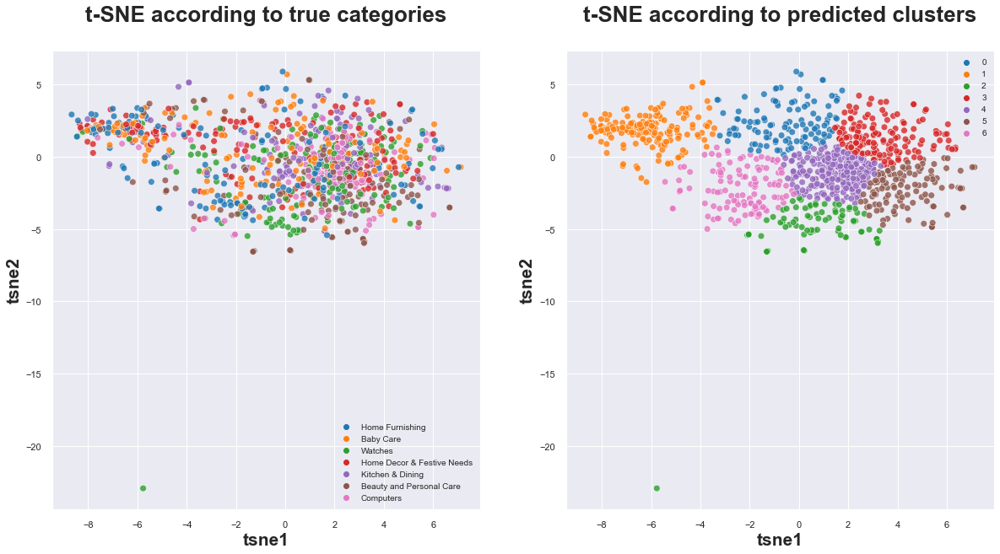

ARI: 0.049
cluster
0    117
1    184
2     86
3    159
4    265
5    117
6    122
Name: label, dtype: int64


In [38]:
# 2.2.1.3 Feature extraction with SIFT
# Non-standardized descriptors before clustering
sift = cv.SIFT_create(nfeatures=1100,
                      nOctaveLayers=3,
                      contrastThreshold=0.04,
                      edgeThreshold=10,
                      sigma=1.6)
sift_features = feature_extraction(model=sift,
                                   pictures_id=pictures_id,
                                   denoising=False,
                                   resize=True,
                                   normalize=False)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=sift_features,
                                            perplexity=70,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
image_models.append('SIFT')
image_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

Standardisation des descripteurs avant le clustering.

0
100
200
300
400
500
600
700
800
900
1000

Descriptors dimensions: (354061, 128)
Model processing time: 57.0 seconds

Clusters number: 595
Creation of 595 descriptors clusters
Processing time: 55.1 seconds
0
100
200
300
400
500
600
700
800
900
1000

Time to create features (histograms): 2.2 seconds
Images features dimensions: (1050, 595)

Dataset dimensions before PCA: (1050, 595)
Dataset dimensions after PCA: (1050, 319)
Processing time: 19.4 seconds
ARI: 0.023


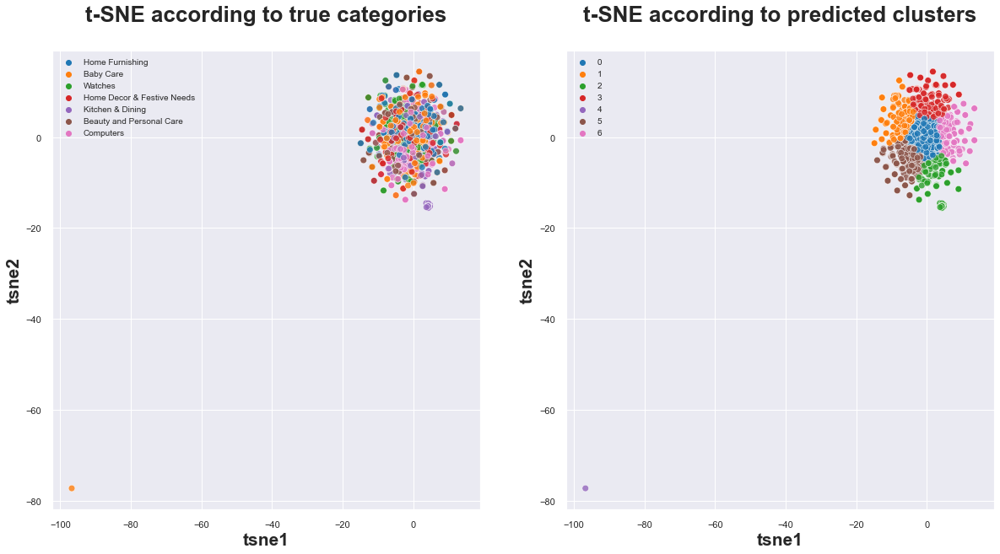

ARI: 0.023
cluster
0    345
1    137
2    115
3    150
4      1
5    166
6    136
Name: label, dtype: int64


In [39]:
# Standardization of descriptors before clustering
sift = cv.SIFT_create(nfeatures=1100,
                      nOctaveLayers=3,
                      contrastThreshold=0.04,
                      edgeThreshold=10,
                      sigma=1.6)
sift_features = feature_extraction(model=sift,
                                   pictures_id=pictures_id,
                                   denoising=False,
                                   resize=True,
                                   normalize=True)

# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=sift_features,
                                            perplexity=50,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
# image_models.append('SIFT')
# image_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

En normalisant les descripteurs avant le clustering, on observe une dégradation du score ARI et une perte légère d'informations.

### 2.2.2 Les algorithmes de type CNN par le Transfer Learning

Les réseaux de neurones convolutifs (CNN) sont des algorithmes de Deep Learning conçus pour traiter des images mais peuvent être utilisés pour des données textuelles.

Le Transfer Learning consiste à utiliser des modèles de Deep Learning entraînés sur un problème pour les exploiter sur un autre problème similaire. Le Transfer Learning est généralement utilisé pour des données peu volumineuses ne permettant pas d'entraîner un modèle complet. Pour effectuer l'extraction des features, il faut retirer les dernières couches fully-connected en configurant le paramètre include_top à False.

Les différentes étapes de prétraitement pour le Transfer Learning sont :
- Le chargement et le redimensionnement de l'image ;
- La conversion de l'image en tableau numpy ;
- L'ajout de la première dimension pour respecter le format d'entrée du réseau (4 dimensions) ;
- La normalisation du tableau numpy.

Il existe plusieurs modèles pré-entraînés. Il faut donc sélectionner le modèle le plus adapté à la tâche à effctuer. Il est également possible d'entraîner les modèles avec le Fine-tuning total ou le Fine-tuning partiel.
Les modèles utilisés dans notre cas d'étude sont pré-entraînés sur ImageNet (1000 catégories d'images).

In [40]:
# 2.2.2 Feature extraction using Transfer learning CNN algorithm
def load_transfer_learning_picture(picture, target_size):
    '''This function loads and returns a resized picture.'''
    # Loading and resizing the picture
    image = load_img(picture, target_size=target_size)

    # Converting the image pixels to a NumPy array
    image = img_to_array(image)
    
    # Reshape input data
    image = np.expand_dims(image, axis=0)
    return image

#### 2.2.2.1 Le modèle ResNet101

In [41]:
# 2.2.2.1 ResNet101 model
# Loading the pre-trained ResNet101 model
# Instantiate a base model with pre-trained weights
resnet101_model = ResNet101(
    # Whether to include the fully-connected layer
    # at the top of the network
    # The output layer fully connected of the model is removed
    include_top=False,
    # Load weights pre-trained on ImageNet
    weights='imagenet',
    # Optional Keras tensor to use as image input for the model
    input_tensor=None,
    # Optional shape tuple
    # only to be specified if include_top is False
    input_shape=(224, 224, 3),
    # Optional pooling mode for feature extraction
    # when include_top is False
    pooling='max',
    # Optional number of classes to classify images into
    # only to be specified if include_top is True
    classes=1000)
resnet101_model.summary()

Model: "resnet101"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                          

In [42]:
# Using the model to extract features
start_time = time.time()
resnet101_features = []
for uniq_id in pictures_id:
    # Loading and resizing the picture
    image = load_transfer_learning_picture(path + uniq_id, (224, 224))
    
    # Preprocessing: normalizing input data
    image = tf.keras.applications.resnet.preprocess_input(image)

    # Get features
    features = resnet101_model.predict(image) 
    resnet101_features.append(features.flatten())
resnet101_features = np.array(resnet101_features)
print(resnet101_features.shape)
duration = time.time() - start_time
print("ResNet101 model processing time: {:.1f} seconds".format(duration))

(1050, 2048)
ResNet101 model processing time: 741.8 seconds



Dataset dimensions before PCA: (1050, 2048)
Dataset dimensions after PCA: (1050, 899)
Processing time: 22.7 seconds
ARI: 0.472


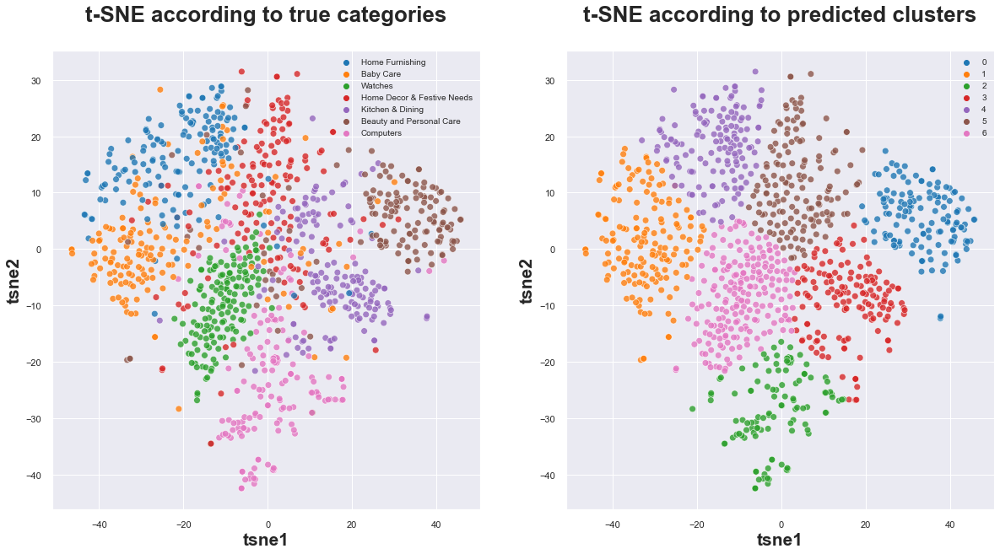

ARI: 0.472
cluster
0    137
1    159
2    113
3    144
4    144
5    148
6    205
Name: label, dtype: int64


In [43]:
# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=resnet101_features,
                                            perplexity=40,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
image_models.append('CNN-ResNet101')
image_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

#### 2.2.2.2 Le modèle ResNet50

In [44]:
# 2.2.2.2 ResNet50 model
# Loading the ResNet50 model
# Instantiate a base model with pre-trained weights
resnet50_model = ResNet50(
    # Whether to include the fully-connected layer
    # at the top of the network
    include_top=False,
    # Load weights pre-trained on ImageNet
    weights='imagenet',
    # Optional Keras tensor to use as image input for the model
    input_tensor=None,
    # Optional shape tuple
    # only to be specified if include_top is False    
    input_shape=(224, 224, 3),
    # Optional pooling mode for feature extraction
    # when include_top is False
    pooling='max',
    # Optional number of classes to classify images into
    # only to be specified if include_top is True
    classes=1000)
resnet50_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [45]:
# Using the model to extract features
start_time = time.time()
resnet50_features = []
for uniq_id in pictures_id:
    # Loading and resizing the picture
    image = load_transfer_learning_picture(path + uniq_id, (224, 224))
    
    # Preprocessing: normalizing input data
    image = tf.keras.applications.resnet50.preprocess_input(image)

    # Get features
    features = resnet50_model.predict(image)
    resnet50_features.append(features.flatten())
resnet50_features = np.array(resnet50_features)
print(resnet50_features.shape)
duration = time.time() - start_time
print("ResNet50 model processing time: {:.1f} seconds".format(duration))

(1050, 2048)
ResNet50 model processing time: 346.6 seconds



Dataset dimensions before PCA: (1050, 2048)
Dataset dimensions after PCA: (1050, 898)
Processing time: 28.0 seconds
ARI: 0.395


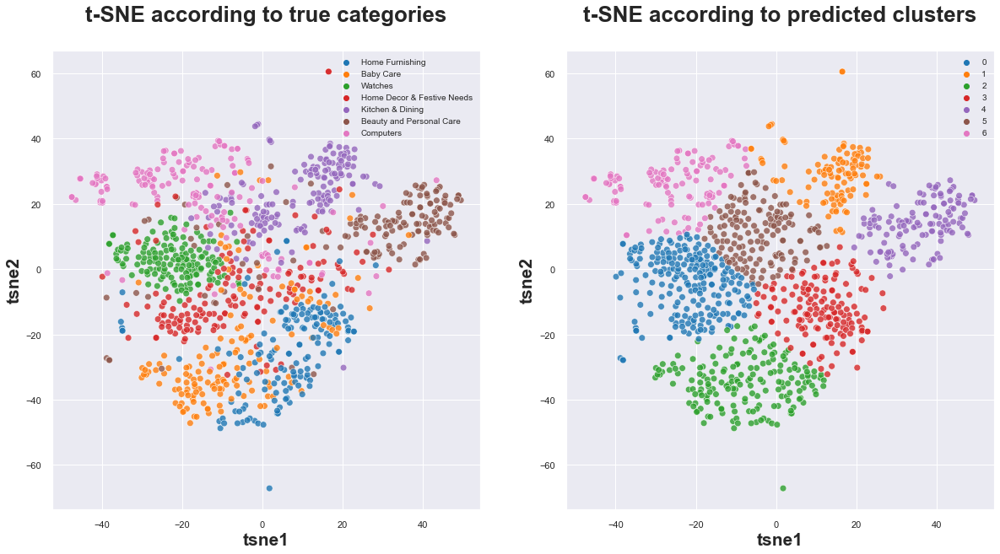

ARI: 0.395
cluster
0    217
1    109
2    180
3    153
4    131
5    145
6    115
Name: label, dtype: int64


In [46]:
# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=resnet50_features,
                                            perplexity=30,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
image_models.append('CNN-ResNet50')
image_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

#### 2.2.2.3 Le modèle EfficientNetB7

In [47]:
# 2.2.2.3 EfficientNetB7 model
# Loading the EfficientNetB7 model
# Instantiate a base model with pre-trained weights
efficientnetb7_model = EfficientNetB7(
    # Whether to include the fully-connected layer
    # at the top of the network    
    include_top=False,
    # Load weights pre-trained on ImageNet
    weights='imagenet',
    # Optional Keras tensor to use as image input for the model
    input_tensor=None,
    # Optional shape tuple
    # only to be specified if include_top is False
    input_shape=(224, 224, 3),
    # Optional pooling mode for feature extraction
    # when include_top is False
    pooling='max',
    # Optional number of classes to classify images into
    # only to be specified if include_top is True
    classes=1000,
    # The activation function to use on the "top" layer
    # Ignored unless include_top=True
    classifier_activation='softmax')
efficientnetb7_model.summary()

Model: "efficientnetb7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_5[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 stem_conv_pad (ZeroPadding2D)  (None, 225, 225, 3)  0           ['normalization[0][0

 block4f_se_reshape (Reshape)   (None, 1, 1, 960)    0           ['block4f_se_squeeze[0][0]']     
                                                                                                  
 block4f_se_reduce (Conv2D)     (None, 1, 1, 40)     38440       ['block4f_se_reshape[0][0]']     
                                                                                                  
 block4f_se_expand (Conv2D)     (None, 1, 1, 960)    39360       ['block4f_se_reduce[0][0]']      
                                                                                                  
 block4f_se_excite (Multiply)   (None, 14, 14, 960)  0           ['block4f_activation[0][0]',     
                                                                  'block4f_se_expand[0][0]']      
                                                                                                  
 block4f_project_conv (Conv2D)  (None, 14, 14, 160)  153600      ['block4f_se_excite[0][0]']      
          

In [48]:
# Using the model to extract features
start_time = time.time()
efficientnetb7_features = []
for uniq_id in pictures_id:
    # Loading and resizing the picture
    image = load_transfer_learning_picture(path + uniq_id, (224, 224))
    
    # Preprocessing: normalizing input data
    image = tf.keras.applications.efficientnet.preprocess_input(image)

    # Get features
    features = efficientnetb7_model.predict(image)
    efficientnetb7_features.append(features.flatten())
efficientnetb7_features = np.array(efficientnetb7_features)
print(efficientnetb7_features.shape)
duration = time.time() - start_time
print("EfficientNetB7 model processing time: {:.1f} seconds".format(duration))

(1050, 2560)
EfficientNetB7 model processing time: 723.4 seconds



Dataset dimensions before PCA: (1050, 2560)
Dataset dimensions after PCA: (1050, 783)
Processing time: 22.9 seconds
ARI: 0.472


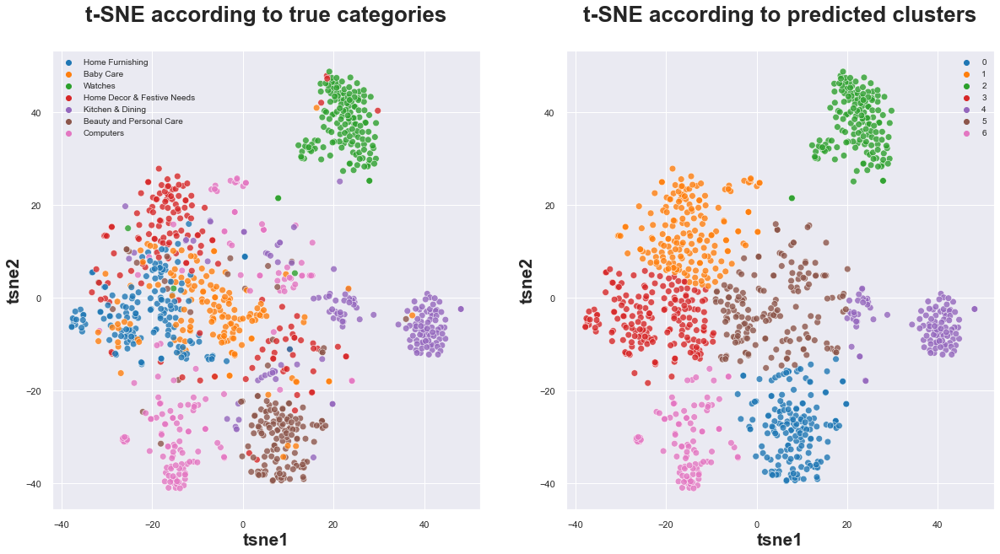

ARI: 0.472
cluster
0    167
1    176
2    153
3    183
4    108
5    167
6     96
Name: label, dtype: int64


In [49]:
# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=efficientnetb7_features,
                                            perplexity=40,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
image_models.append('CNN-EfficientNetB7')
image_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

## 2.3 Classement des différentes approches d'extraction de features

In [50]:
# 2.3 Classification of the different feature extraction approaches
image_classification = pd.DataFrame(columns=['Model', 'ARI'])
image_classification['Model'] = image_models
image_classification['ARI'] = np.round(image_ari, 3)
image_classification = image_classification.sort_values(['ARI'],
                                                        ascending=False)
image_classification.reset_index(inplace=True, drop=True)
image_classification

,Model,ARI
0,CNN-ResNet101,0.472
1,CNN-EfficientNetB7,0.472
2,CNN-ResNet50,0.395
3,ORB,0.049
4,SIFT,0.049


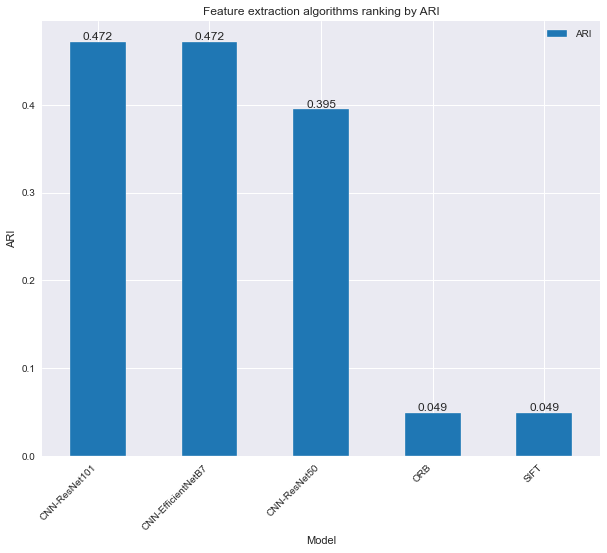

,ARI
Model,
CNN-ResNet101,0.472
CNN-EfficientNetB7,0.472
CNN-ResNet50,0.395
ORB,0.049
SIFT,0.049


In [51]:
# Displaying histogram
image_dataviz = image_classification.set_index('Model')
display_histogram(data=image_dataviz,
                  ranking_var='ARI',
                  sort=False,
                  fig_size=(10, 8),
                  color='tab:blue',
                  feat_extract=True)
image_dataviz

- Les approches de type CNN par le Transfer Learning sont plus performantes ;
- EfficientNetB7 et ResNet101 sont les modèles les mieux classés.

# 3. Combinaison de features et comparaison des classifications

## 3.1 Combinaison de features des données textuelles et visuelles

On effectue la concaténation par colonne des deux tableaux issus des extractions des features des données textuelles et visuelles.

In [52]:
# 3. Combining features and comparing classifications
# 3.1 Combination of textual and visual data features
text_features = sbert_features
image_features = efficientnetb7_features
merged_features = np.hstack((text_features, image_features))
print(merged_features.shape)

(1050, 3328)


## 3.2 Comparaison des classifications non supervisées

In [53]:
# 3.2 Comparison of unsupervised classifications
feature_type = []
unsupervised_ari = []

### 3.2.1 Clusterings

#### 3.2.1.1 Features des données textuelles


Dataset dimensions before PCA: (1050, 768)
Dataset dimensions after PCA: (1050, 381)
Processing time: 13.9 seconds
ARI: 0.715


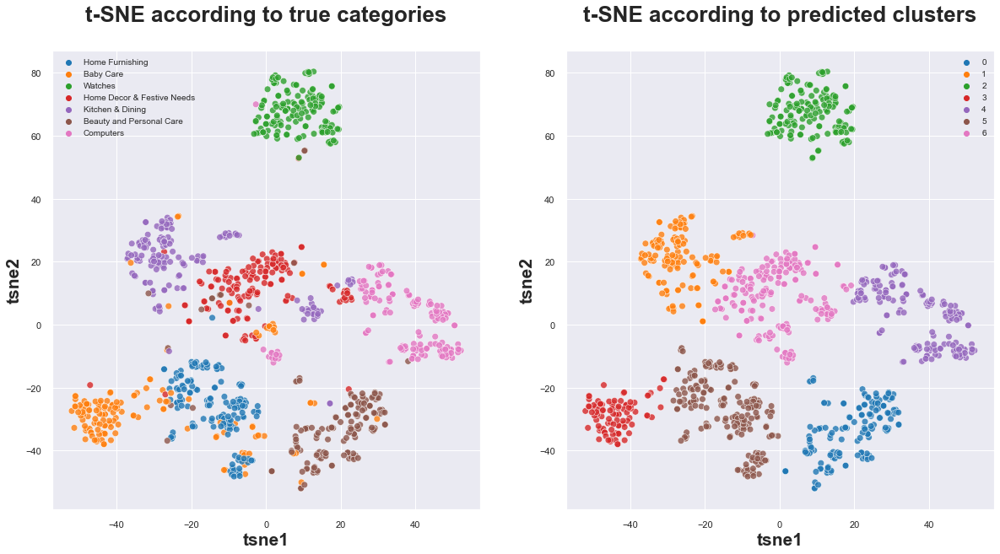

ARI: 0.715
cluster
0    145
1    136
2    154
3     93
4    154
5    187
6    181
Name: label, dtype: int64


In [54]:
# 3.2.1 Clusterings
# 3.2.1.1 Textual data features
# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=text_features,
                                            perplexity=30,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
feature_type.append('Text')
unsupervised_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

#### 3.2.1.2 Features des données visuelles


Dataset dimensions before PCA: (1050, 2560)
Dataset dimensions after PCA: (1050, 783)
Processing time: 23.8 seconds
ARI: 0.472


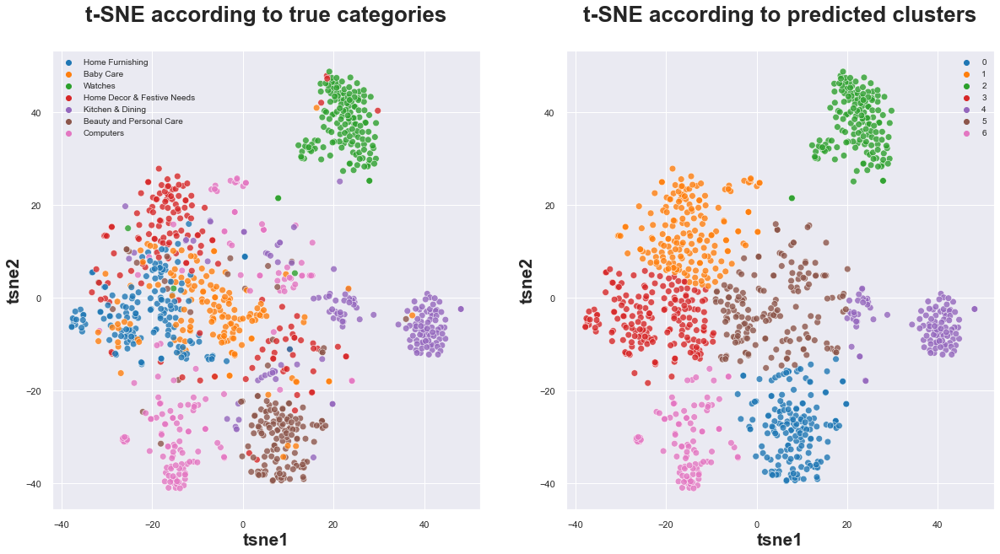

ARI: 0.472
cluster
0    167
1    176
2    153
3    183
4    108
5    167
6     96
Name: label, dtype: int64


In [55]:
# 3.2.1.2 Visual data features
# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=image_features,
                                            perplexity=40,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
feature_type.append('Image')
unsupervised_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

#### 3.2.1.3 Combinaison de features des données textuelles et visuelles


Dataset dimensions before PCA: (1050, 3328)
Dataset dimensions after PCA: (1050, 820)
Processing time: 24.0 seconds
ARI: 0.607


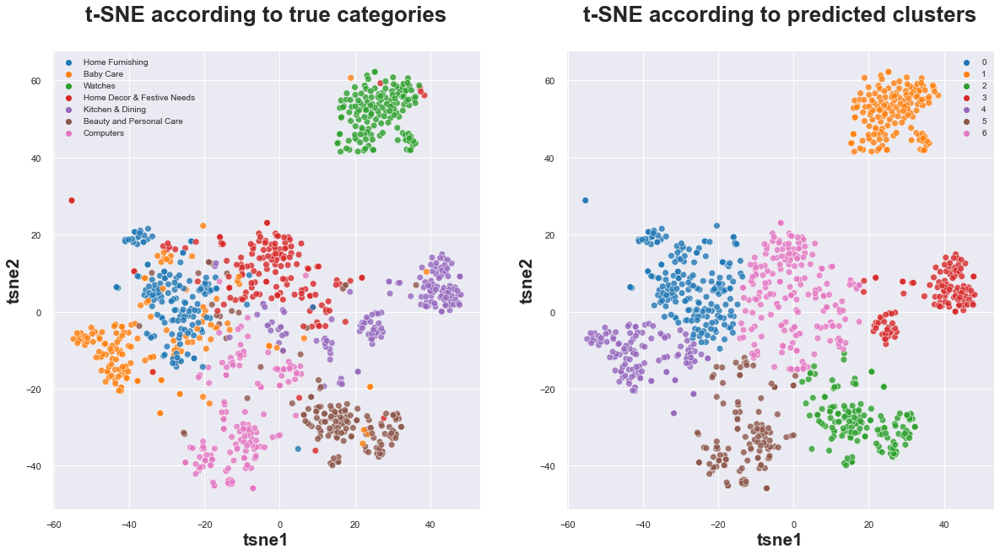

ARI: 0.607
cluster
0    191
1    155
2    149
3    115
4    123
5    124
6    193
Name: label, dtype: int64


In [56]:
# 3.2.1.3 Combination of textual and visual data features
# Dimensionality reduction and clustering
ARI, X_tsne, pred_labels = apply_clustering(data=merged_features,
                                            perplexity=30,
                                            N_CLUST=N_CLASS,
                                            apply_pca=True,
                                            apply_svd=False)
feature_type.append('Text & Image combination')
unsupervised_ari.append(ARI)

# Displaying metric, true categories and clusters
display_clustering(X_tsne, categories, labels, pred_labels, ARI)

### 3.2.2 Classement des différents types de features

In [57]:
# 3.2.2 Ranking the different types of features
classification = pd.DataFrame(columns=['Feature_type', 'ARI'])
classification['Feature_type'] = feature_type
classification['ARI'] = np.round(unsupervised_ari, 3)
classification = classification.sort_values(['ARI'], ascending=False)
classification.reset_index(inplace=True, drop=True)
unsupervised_df = classification.set_index('Feature_type')
unsupervised_df

,ARI
Feature_type,
Text,0.715
Text & Image combination,0.607
Image,0.472


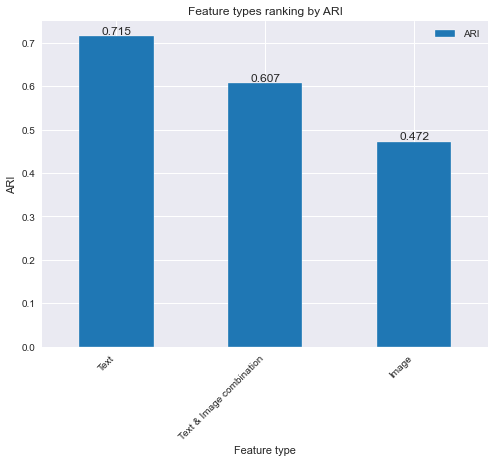

In [58]:
# Displaying histogram
display_histogram(data=unsupervised_df,
                  ranking_var='ARI',
                  sort=False,
                  fig_size=(8, 6),
                  color='tab:blue',
                  feat_extract=False)

Le clustering avec les features des données textuelles est plus efficace.

# Conclusion

- Pour extraire les features des données textuelles, l'approche de type "Word/Sentence embeddings" avec SBERT est la plus performante ;
- Pour extraire les features des données visuelles, les approches de type réseaux de neurones convolutifs (CNN) par le Transfer Learning sont plus performantes ;
- Le clustering avec les features des données textuelles est plus efficace ;
- L’étude de faisabilité rapide permet de conclure que la possibilité ou non de regrouper automatiquement des produits de même catégories dépend de l'algorithme utilisé ;
- Pour trouver les meilleurs modèles les plus adaptés, il est possible d’approfondir l’analyse et les tests des différents modèles de Deep Learning (Word/Sentence embeddings et Transfer Learning).

# ANNEXE 1 : Comparaison des classifications supervisées

Nous allons effectuer une classification supervisée rapide pour avoir une idée de l'efficacité d'un moteur de classification pour le regroupement automatique des produits de même catégorie. C'est pourquoi on ne s'intéresse qu'à l'évaluation du nombre d'échantillons correctement prédits.

Les principales métriques utilisées pour évaluer les performances des modèles de classification sont :
- Accucracy : la proportion de points correctement prédits. C'est le rapport entre le nombre de prédictions correctes et le nombre total de prédictions.
- AUC : l'aire sous la courbe ROC (Receiver-Operator Characteristic) est un indicateur de la performance globale d'un modèle.
- Precision : la capacité d'un modèle à ne pas étiqueter comme positif un échantillon qui est négatif. La meilleure valeur est 1 et la pire valeur est 0. Plus le modèle prédit de faux positifs, plus la précision est faible.
- Recall : la capacité d'un modèle à retrouver tous les échantillons positifs. La meilleure valeur est 1 et la pire valeur est 0. Plus le modèle prédit de faux négatifs, plus le rappel est faible.
- F-beta score : la moyenne harmonique pondérée de la précision et du rappel définit l'influence de la précision ou du rappel sur l'évaluation. Le paramètre bêta détermine le poids de la précision ou du rappel dans le score combiné. La meilleure valeur est 1 et la pire valeur est 0. Dans ce cas, bêta vaut 1.
- Confusion matrix : une matrice qui montre le nombre de prédictions correctes et incorrectes faites par le modèle par rapport aux classifications réelles du jeu de test et qui permet de savoir les types d'erreurs (erreur de type I : les faux positifs, et erreur de type II : les faux négatifs).

Nous prenons également en compte le temps de calcul : time (s).

## 1. Sélection des modèles par la validation croisée et prédictions

In [59]:
# Appendix 1: Comparison of supervised classifications
# 1. Model selection by cross-validation and predictions
features_type = []
accuracy = []

### 1.1 Features des données textuelles

In [60]:
# 1.1 Textual data features
# Creating a dataframe with features
text_features_names = []
for i in range(text_features.shape[1]):
    text_features_names.append('text_feature_' + str(i))
text_features_df = pd.DataFrame(text_features,
                                columns=text_features_names)
text_features_df['label'] = data.label
print(text_features_df.shape)
text_features_df.head(5)

(1050, 769)


,text_feature_0,text_feature_1,text_feature_2,text_feature_3,text_feature_4,text_feature_5,text_feature_6,text_feature_7,text_feature_8,text_feature_9,text_feature_10,text_feature_11,text_feature_12,text_feature_13,text_feature_14,text_feature_15,text_feature_16,text_feature_17,text_feature_18,text_feature_19,text_feature_20,text_feature_21,text_feature_22,text_feature_23,text_feature_24,text_feature_25,text_feature_26,text_feature_27,text_feature_28,text_feature_29,text_feature_30,text_feature_31,text_feature_32,text_feature_33,text_feature_34,text_feature_35,text_feature_36,text_feature_37,text_feature_38,text_feature_39,text_feature_40,text_feature_41,text_feature_42,text_feature_43,text_feature_44,text_feature_45,text_feature_46,text_feature_47,text_feature_48,text_feature_49,text_feature_50,text_feature_51,text_feature_52,text_feature_53,text_feature_54,text_feature_55,text_feature_56,text_feature_57,text_feature_58,text_feature_59,text_feature_60,text_feature_61,text_feature_62,text_feature_63,text_feature_64,text_feature_65,text_feature_66,text_feature_67,text_feature_68,text_feature_69,text_feature_70,text_feature_71,text_feature_72,text_feature_73,text_feature_74,text_feature_75,text_feature_76,text_feature_77,text_feature_78,text_feature_79,text_feature_80,text_feature_81,text_feature_82,text_feature_83,text_feature_84,text_feature_85,text_feature_86,text_feature_87,text_feature_88,text_feature_89,text_feature_90,text_feature_91,text_feature_92,text_feature_93,text_feature_94,text_feature_95,text_feature_96,text_feature_97,text_feature_98,text_feature_99,text_feature_100,text_feature_101,text_feature_102,text_feature_103,text_feature_104,text_feature_105,text_feature_106,text_feature_107,text_feature_108,text_feature_109,text_feature_110,text_feature_111,text_feature_112,text_feature_113,text_feature_114,text_feature_115,text_feature_116,text_feature_117,text_feature_118,text_feature_119,text_feature_120,text_feature_121,text_feature_122,text_feature_123,text_feature_124,text_feature_125,text_feature_126,text_feature_127,text_feature_128,text_feature_129,text_feature_130,text_feature_131,text_feature_132,text_feature_133,text_feature_134,text_feature_135,text_feature_136,text_feature_137,text_feature_138,text_feature_139,text_feature_140,text_feature_141,text_feature_142,text_feature_143,text_feature_144,text_feature_145,text_feature_146,text_feature_147,text_feature_148,text_feature_149,text_feature_150,text_feature_151,text_feature_152,text_feature_153,text_feature_154,text_feature_155,text_feature_156,text_feature_157,text_feature_158,text_feature_159,text_feature_160,text_feature_161,text_feature_162,text_feature_163,text_feature_164,text_feature_165,text_feature_166,text_feature_167,text_feature_168,text_feature_169,text_feature_170,text_feature_171,text_feature_172,text_feature_173,text_feature_174,text_feature_175,text_feature_176,text_feature_177,text_feature_178,text_feature_179,text_feature_180,text_feature_181,text_feature_182,text_feature_183,text_feature_184,text_feature_185,text_feature_186,text_feature_187,text_feature_188,text_feature_189,text_feature_190,text_feature_191,text_feature_192,text_feature_193,text_feature_194,text_feature_195,text_feature_196,text_feature_197,text_feature_198,text_feature_199,text_feature_200,text_feature_201,text_feature_202,text_feature_203,text_feature_204,text_feature_205,text_feature_206,text_feature_207,text_feature_208,text_feature_209,text_feature_210,text_feature_211,text_feature_212,text_feature_213,text_feature_214,text_feature_215,text_feature_216,text_feature_217,text_feature_218,text_feature_219,text_feature_220,text_feature_221,text_feature_222,text_feature_223,text_feature_224,text_feature_225,text_feature_226,text_feature_227,text_feature_228,text_feature_229,text_feature_230,text_feature_231,text_feature_232,text_feature_233,text_feature_234,text_feature_235,text_feature_236,text_feature_237,text_feature_238,text_feature_239,text_feature_240,text_feature

In [61]:
# Split into training set and test set
text_train_df, text_test_df = train_test_split(text_features_df,
                                               test_size=0.3,
                                               random_state=0,
                                               shuffle=True)

# Setup initialization
s = setup(
    # Input
    data=text_train_df,
    # Name of the target column to be passed in as a string
    target='label',
    # When set to True, features with the inter-correlations higher
    # than the defined threshold are removed
    remove_multicollinearity=True,
    # Threshold for correlated features
    multicollinearity_threshold=0.9,
    # When set to True, it transforms the numeric features
    # by scaling them to a given range
    normalize=True,
    # Defines the method for scaling:
    # 'zscore', 'minmax', 'maxabs' and 'robust'
    normalize_method='zscore',
    # When set to True, it applies the power transform
    # to make data more Gaussian-like
    transformation=True,
    # Defines the method for transformation:
    # 'yeo-johnson', 'quantile'
    transformation_method='quantile',
    # When set to True, dimensionality reduction is applied
    # to project the data into a lower dimensional space
    pca=True,
    # The PCA method to use: 'linear', 'kernel', 'incremental'
    pca_method='linear',
    # Number of components to keep: float for percentage
    # and integer for number of features to be kept
    pca_components=0.99,
    # When training dataset has unequal distribution of target class
    # it can be balanced using this parameter
    fix_imbalance=False,
    # When set to False, prevents shuffling of rows
    # during 'train_test_split'
    data_split_shuffle=True,
    # Controls stratification during 'train_test_split'
    # When set to True, will stratify by target column
    data_split_stratify=True,
    # Number of folds to be used in cross validation
    fold=5,
    # Controls the shuffle parameter of CV
    fold_shuffle=True,
    # The number of jobs to run in parallel -1 means using all processors
    n_jobs=-1,
    # Controls the randomness of experiment
    session_id=0,
    # Controls the confirmation input of data types when setup is executed
    silent=True)

# Best model selection by using cross-validation
text_best = compare_models(
    # To omit certain models from training and evaluation
    # pass a list containing model id in the exclude parameter
    exclude=['dt', 'gpc', 'qda',
             'ada', 'et', 'catboost',
             'gbc', 'xgboost'],
    # Whether to use cross-validation for metrics evaluation
    cross_validation=True,
    # The sort order of the score grid
    sort='Accuracy')
text_best

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9514,0.9944,0.9496,0.9558,0.9513,0.9432,0.9440,1.8980
svm,SVM - Linear Kernel,0.9437,0.0000,0.9428,0.9473,0.9436,0.9342,0.9348,0.0280
knn,K Neighbors Classifier,0.9358,0.9811,0.9336,0.9410,0.9351,0.9251,0.9261,0.7700
lightgbm,Light Gradient Boosting Machine,0.9339,0.9890,0.9319,0.9393,0.9330,0.9228,0.9239,1.6400
ridge,Ridge Classifier,0.9027,0.0000,0.9017,0.9096,0.9024,0.8864,0.8877,0.0140
rf,Random Forest Classifier,0.8931,0.9838,0.8898,0.9035,0.8873,0.8751,0.8779,0.1760
lda,Linear Discriminant Analysis,0.8833,0.9811,0.8813,0.8924,0.8829,0.8637,0.8653,0.0300
nb,Naive Bayes,0.7607,0.9557,0.7630,0.7931,0.7635,0.7210,0.7255,0.0180
dummy,Dummy Classifier,0.1459,0.5000,0.1429,0.0213,0.0372,0.0000,0.0000,0.0120


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

              precision    recall  f1-score   support

           0       0.89      0.72      0.80        57
           1       0.93      0.95      0.94        44
           2       1.00      0.98      0.99        43
           3       0.88      0.86      0.87        42
           4       0.79      0.98      0.87        42
           5       0.93      0.98      0.95        42
           6       1.00      1.00      1.00        45

    accuracy                           0.91       315
   macro avg       0.92      0.92      0.92       315
weighted avg       0.92      0.91      0.91       315



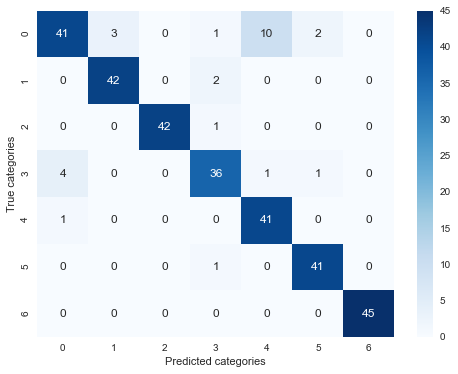

In [62]:
# Predictions
predictions = predict_model(text_best, data=text_test_df)

# Metrics
y_test = np.array(text_test_df.label)
y_pred = np.array(predictions.Label)
features_type.append('Text')
accuracy.append(metrics.accuracy_score(y_test, y_pred))

# Classification report
print(metrics.classification_report(y_test, y_pred))

# Confusion matrix
conf_mat = metrics.confusion_matrix(y_test, y_pred)

# Setup the figure
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(conf_mat,
            annot=True,
            fmt='d',
            cmap='Blues')
plt.ylabel('True categories')
plt.xlabel('Predicted categories')
plt.show()

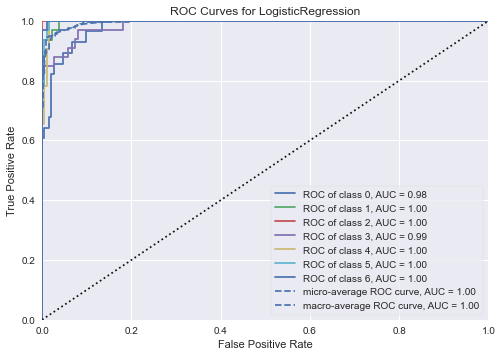

In [63]:
# ROC curves
plot_model(text_best)

### 1.2 Features des données visuelles

In [64]:
# 1.2 Visual data features
# Creating a dataframe with features
image_features_names = []
for i in range(image_features.shape[1]):
    image_features_names.append('image_feature_' + str(i))
image_features_df = pd.DataFrame(image_features,
                                 columns=image_features_names)
image_features_df['label'] = data.label
print(image_features_df.shape)
image_features_df.head(5)

(1050, 2561)


,image_feature_0,image_feature_1,image_feature_2,image_feature_3,image_feature_4,image_feature_5,image_feature_6,image_feature_7,image_feature_8,image_feature_9,...,image_feature_2551,image_feature_2552,image_feature_2553,image_feature_2554,image_feature_2555,image_feature_2556,image_feature_2557,image_feature_2558,image_feature_2559,label
0,1.089622,1.260312,0.768759,3.111938,1.891617,0.127769,2.011972,2.364847,2.983534,1.000704,...,1.692379,1.613881,1.196800,3.080956,5.526373,3.811254,0.169399,1.653739,1.671555,4
1,-0.016369,0.063599,3.673075,3.584752,1.384337,2.619921,1.132870,2.065636,1.015355,3.134467,...,2.771038,2.688855,0.154189,0.027491,3.467002,0.915773,0.170765,0.819703,0.217935,0
2,-0.094806,0.972751,4.470722,4.609430,0.640283,1.390614,0.787235,0.710531,2.532958,3.447020,...,0.857026,2.991788,0.472803,0.697812,1.982037,0.625742,1.437601,3.494787,1.728349,0
3,0.341644,1.040760,4.952017,3.823149,0.522987,2.569549,2.641690,3.382822,2.061662,1.279824,...,3.257221,2.442018,2.881872,1.461150,1.911987,2.657455,0.926454,4.131410,4.310039,4
4,0.173285,2.252218,1.831332,2.438621,-0.085870,1.394760,0.558595,0.913776,2.400994,1.001921,...,0.780810,0.922667,1.396357,4.503037,2.420977,3.754685,-0.014902,2.037998,4.504130,4


In [65]:
# Split into training set and test set
image_train_df, image_test_df = train_test_split(image_features_df,
                                                 test_size=0.3,
                                                 random_state=0,
                                                 shuffle=True)

# Setup initialization
s = setup(
    # Input
    data=image_train_df,
    # Name of the target column to be passed in as a string
    target='label',
    # When set to True, features with the inter-correlations higher
    # than the defined threshold are removed
    remove_multicollinearity=True,
    # Threshold for correlated features
    multicollinearity_threshold=0.9,
    # When set to True, it transforms the numeric features
    # by scaling them to a given range
    normalize=True,
    # Defines the method for scaling:
    # 'zscore', 'minmax', 'maxabs' and 'robust'
    normalize_method='zscore',
    # When set to True, it applies the power transform
    # to make data more Gaussian-like
    transformation=True,
    # Defines the method for transformation:
    # 'yeo-johnson', 'quantile'
    transformation_method='quantile',
    # When set to True, dimensionality reduction is applied
    # to project the data into a lower dimensional space
    pca=True,
    # The PCA method to use: 'linear', 'kernel', 'incremental'
    pca_method='linear',
    # Number of components to keep: float for percentage
    # and integer for number of features to be kept
    pca_components=0.99,
    # When training dataset has unequal distribution of target class
    # it can be balanced using this parameter
    fix_imbalance=False,
    # When set to False, prevents shuffling of rows
    # during 'train_test_split'
    data_split_shuffle=True,
    # Controls stratification during 'train_test_split'
    # When set to True, will stratify by target column
    data_split_stratify=True,
    # Number of folds to be used in cross validation
    fold=5,
    # Controls the shuffle parameter of CV
    fold_shuffle=True,
    # The number of jobs to run in parallel -1 means using all processors
    n_jobs=-1,
    # Controls the randomness of experiment
    session_id=0,
    # Controls the confirmation input of data types when setup is executed
    silent=True)

# Best model selection by using cross-validation
image_best = compare_models(
    # To omit certain models from training and evaluation
    # pass a list containing model id in the exclude parameter
    exclude=['dt', 'gpc', 'qda',
             'ada', 'et', 'catboost',
             'gbc', 'xgboost'],
    # Whether to use cross-validation for metrics evaluation
    cross_validation=True,
    # The sort order of the score grid
    sort='Accuracy')
image_best

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8580,0.9778,0.8565,0.8622,0.8564,0.8342,0.8354,0.0900
svm,SVM - Linear Kernel,0.8483,0.0000,0.8469,0.8541,0.8468,0.8229,0.8242,0.0180
lightgbm,Light Gradient Boosting Machine,0.8230,0.9630,0.8191,0.8324,0.8198,0.7933,0.7955,2.3380
rf,Random Forest Classifier,0.7724,0.9375,0.7677,0.7890,0.7729,0.7342,0.7373,0.2220
knn,K Neighbors Classifier,0.7549,0.9362,0.7540,0.8013,0.7525,0.7140,0.7216,0.0340
ridge,Ridge Classifier,0.5622,0.0000,0.5614,0.5937,0.5623,0.4894,0.4932,0.0100
nb,Naive Bayes,0.5388,0.8116,0.5356,0.6072,0.5389,0.4616,0.4747,0.0140
lda,Linear Discriminant Analysis,0.3463,0.6323,0.3438,0.3380,0.3311,0.2365,0.2390,0.0400
dummy,Dummy Classifier,0.1459,0.5000,0.1429,0.0213,0.0372,0.0000,0.0000,0.0080


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

              precision    recall  f1-score   support

           0       0.81      0.61      0.70        57
           1       0.83      0.89      0.86        44
           2       0.81      0.91      0.86        43
           3       0.82      0.79      0.80        42
           4       0.71      0.86      0.77        42
           5       0.93      0.90      0.92        42
           6       1.00      1.00      1.00        45

    accuracy                           0.84       315
   macro avg       0.84      0.85      0.84       315
weighted avg       0.84      0.84      0.84       315



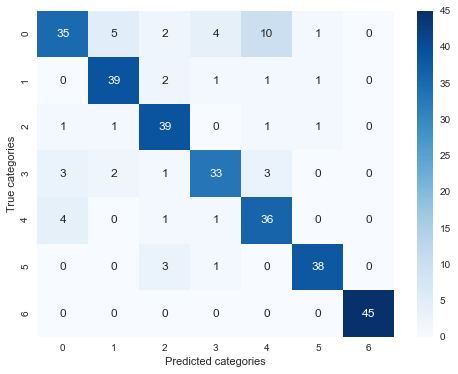

In [66]:
# Predictions
predictions = predict_model(image_best, data=image_test_df)

# Metrics
y_test = np.array(image_test_df.label)
y_pred = np.array(predictions.Label)
features_type.append('Image')
accuracy.append(metrics.accuracy_score(y_test, y_pred))

# Classification report
print(metrics.classification_report(y_test, y_pred))

# Confusion matrix
conf_mat = metrics.confusion_matrix(y_test, y_pred)

# Setup the figure
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(conf_mat,
            annot=True,
            fmt='d',
            cmap='Blues')
plt.ylabel('True categories')
plt.xlabel('Predicted categories')
plt.show()

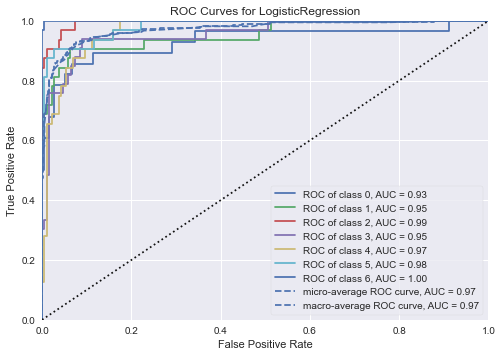

In [67]:
# ROC curves
plot_model(image_best)

### 1.3 Combinaison de features des données textuelles et visuelles

In [68]:
# 1.3 Combination of textual and visual data features
# Creating a dataframe with features
merged_features_names = []
for i in range(merged_features.shape[1]):
    merged_features_names.append('feature_' + str(i))
merged_features_df = pd.DataFrame(merged_features,
                                  columns=merged_features_names)
merged_features_df['label'] = data.label
print(merged_features_df.shape)
merged_features_df.head(5)

(1050, 3329)


,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_3319,feature_3320,feature_3321,feature_3322,feature_3323,feature_3324,feature_3325,feature_3326,feature_3327,label
0,0.004504,-0.034070,-0.006298,0.046515,-0.089786,-0.018055,-0.005251,-0.004450,-0.017012,-0.012753,...,1.692379,1.613881,1.196800,3.080956,5.526373,3.811254,0.169399,1.653739,1.671555,4
1,-0.005947,-0.092113,-0.017590,-0.005953,-0.058235,-0.033396,0.016734,0.043204,0.054780,-0.033973,...,2.771038,2.688855,0.154189,0.027491,3.467002,0.915773,0.170765,0.819703,0.217935,0
2,-0.008129,-0.078053,-0.005930,0.001560,-0.014301,-0.015283,0.029346,0.009079,-0.029272,0.038887,...,0.857026,2.991788,0.472803,0.697812,1.982037,0.625742,1.437601,3.494787,1.728349,0
3,-0.008160,-0.007871,0.000900,0.048170,-0.070761,-0.046678,-0.069111,0.040844,-0.058523,-0.009381,...,3.257221,2.442018,2.881872,1.461150,1.911987,2.657455,0.926454,4.131410,4.310039,4
4,0.050135,-0.041571,-0.018313,0.058252,-0.063883,-0.001256,-0.025376,0.062303,-0.027251,0.009423,...,0.780810,0.922667,1.396357,4.503037,2.420977,3.754685,-0.014902,2.037998,4.504130,4


In [69]:
# Split into training set and test set
merged_train_df, merged_test_df = train_test_split(merged_features_df,
                                                   test_size=0.3,
                                                   random_state=0,
                                                   shuffle=True)

# Setup initialization
s = setup(
    # Input
    data=merged_train_df,
    # Name of the target column to be passed in as a string
    target='label',
    # When set to True, features with the inter-correlations higher
    # than the defined threshold are removed
    remove_multicollinearity=True,
    # Threshold for correlated features
    multicollinearity_threshold=0.9,
    # When set to True, it transforms the numeric features
    # by scaling them to a given range
    normalize=True,
    # Defines the method for scaling:
    # 'zscore', 'minmax', 'maxabs' and 'robust'
    normalize_method='zscore',
    # When set to True, it applies the power transform
    # to make data more Gaussian-like
    transformation=True,
    # Defines the method for transformation:
    # 'yeo-johnson', 'quantile'
    transformation_method='quantile',
    # When set to True, dimensionality reduction is applied
    # to project the data into a lower dimensional space
    pca=True,
    # The PCA method to use: 'linear', 'kernel', 'incremental'
    pca_method='linear',
    # Number of components to keep: float for percentage
    # and integer for number of features to be kept
    pca_components=0.99,
    # When training dataset has unequal distribution of target class
    # it can be balanced using this parameter
    fix_imbalance=False,
    # When set to False, prevents shuffling of rows
    # during 'train_test_split'
    data_split_shuffle=True,
    # Controls stratification during 'train_test_split'
    # When set to True, will stratify by target column
    data_split_stratify=True,
    # Number of folds to be used in cross validation
    fold=5,
    # Controls the shuffle parameter of CV
    fold_shuffle=True,
    # The number of jobs to run in parallel -1 means using all processors
    n_jobs=-1,
    # Controls the randomness of experiment
    session_id=0,
    # Controls the confirmation input of data types when setup is executed
    silent=True)

# Best model selection by using cross-validation
merged_best = compare_models(
    # To omit certain models from training and evaluation
    # pass a list containing model id in the exclude parameter
    exclude=['dt', 'gpc', 'qda',
             'ada', 'et', 'catboost',
             'gbc', 'xgboost'],
    # Whether to use cross-validation for metrics evaluation
    cross_validation=True,
    # The sort order of the score grid
    sort='Accuracy')
merged_best

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9358,0.9918,0.9340,0.9395,0.9349,0.9251,0.9260,0.0740
svm,SVM - Linear Kernel,0.9241,0.0000,0.9232,0.9313,0.9235,0.9114,0.9127,0.0180
knn,K Neighbors Classifier,0.8658,0.9662,0.8646,0.8904,0.8670,0.8432,0.8477,0.0340
lightgbm,Light Gradient Boosting Machine,0.8657,0.9809,0.8613,0.8748,0.8611,0.8431,0.8455,2.3340
rf,Random Forest Classifier,0.8191,0.9581,0.8155,0.8282,0.8139,0.7887,0.7914,0.1780
ridge,Ridge Classifier,0.6925,0.0000,0.6912,0.7225,0.6936,0.6413,0.6459,0.0100
nb,Naive Bayes,0.6381,0.8599,0.6342,0.6936,0.6426,0.5774,0.5871,0.0100
lda,Linear Discriminant Analysis,0.2004,0.5444,0.1984,0.2056,0.1768,0.0663,0.0690,0.0420
dummy,Dummy Classifier,0.1459,0.5000,0.1429,0.0213,0.0372,0.0000,0.0000,0.2060


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

              precision    recall  f1-score   support

           0       0.91      0.72      0.80        57
           1       0.89      0.89      0.89        44
           2       0.98      1.00      0.99        43
           3       0.93      0.93      0.93        42
           4       0.80      0.98      0.88        42
           5       0.95      1.00      0.98        42
           6       1.00      1.00      1.00        45

    accuracy                           0.92       315
   macro avg       0.92      0.93      0.92       315
weighted avg       0.92      0.92      0.92       315



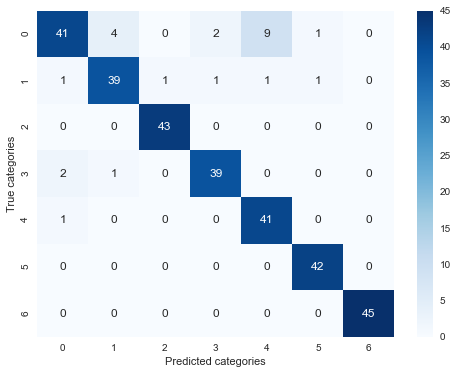

In [70]:
# Predictions
predictions = predict_model(merged_best, data=merged_test_df)

# Metrics
y_test = np.array(merged_test_df.label)
y_pred = np.array(predictions.Label)
features_type.append('Text & Image combination')
accuracy.append(metrics.accuracy_score(y_test, y_pred))

# Classification report
print(metrics.classification_report(y_test, y_pred))

# Confusion matrix
conf_mat = metrics.confusion_matrix(y_test, y_pred)

# Setup the figure
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(conf_mat,
            annot=True,
            fmt='d',
            cmap='Blues')
plt.ylabel('True categories')
plt.xlabel('Predicted categories')
plt.show()

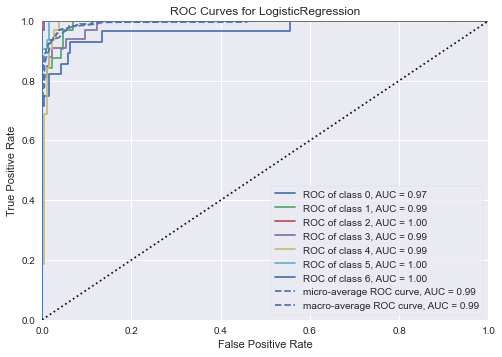

In [71]:
# ROC curves
plot_model(merged_best)

## 2. Classement des différents types de features

In [72]:
# 2. Ranking the different types of features
ranking_df = pd.DataFrame(columns=['Feature type', 'Accuracy'])
ranking_df['Feature type'] = features_type
ranking_df['Accuracy'] = np.round(accuracy, 3)
ranking_df = ranking_df.sort_values(['Accuracy'],
                                    ascending=False)
ranking_df.reset_index(inplace=True, drop=True)
supervised_df = ranking_df.set_index('Feature type')
supervised_df

,Accuracy
Feature type,
Text & Image combination,0.921
Text,0.914
Image,0.841


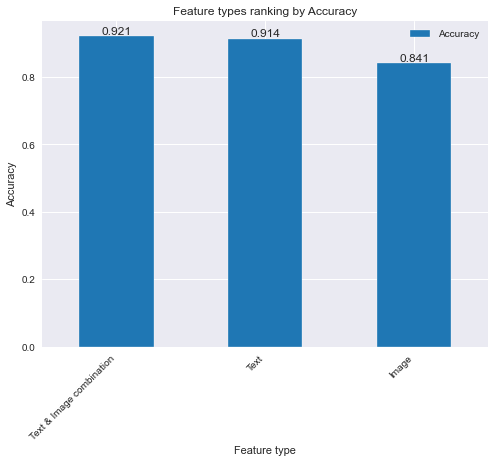

In [73]:
# Displaying histogram
display_histogram(data=supervised_df[['Accuracy']],
                  ranking_var='Accuracy',
                  sort=False,
                  fig_size=(8, 6),
                  color=['tab:blue'],
                  feat_extract=False)

- Les classifications avec les features combinés et les features des données textuelles sont plus efficaces ;
- Les résultats des classifications supervisées rapides sont satisfaisants.